# Мартьянова Александра Евгеньевна, курс «Data Science», ВКР

# Часть 1. Статистические модели

### Загрузка библиотек

In [1]:
# Загрузка разных библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statistics
from scipy.stats import f_oneway

### 1. Подготовка и предобработка данных

Исходный датасет по композитам

###### Датасет со свойствами композитов. Объединение по индексу, тип объединения INNER

In [2]:
# Загрузка в объект DataFrame файла X_bp.xlsx, метод read_excel
x_bp = pd.read_excel('X_bp.xlsx', index_col = 0)
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Определение количества строк и столбцов объекта, метод shape
x_bp.shape

(1023, 10)

In [4]:
# Вывод сведений об объекте DataFrame, метод info()
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [5]:
# Загрузка в объект DataFrame файла X_nup.xlsx, метод read_excel
x_nup = pd.read_excel('X_nup.xlsx', index_col = 0)
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


In [6]:
# Определение количества строк и столбцов объекта, метод shape
x_nup.shape

(1040, 3)

In [7]:
# Вывод сведений об объекте DataFrame, метод info()
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1040 entries, 0.0 to 1039.0
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   float64
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(3)
memory usage: 32.5 KB


In [8]:
# соединение объектов DataFrame, метод merge, объединение по индексу, тип объединения INNER
df_s = x_bp.merge(x_nup, how = 'inner', left_index = True, right_index = True)
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [9]:
# Вывод сведений о новом объекте DataFrame df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

Вывод: соединение произведено по индексам, и часть данных была отброшена при соединении датасетов в общий новый датасет. Тип данных во всех колонках - float64.

In [10]:
# Изменение типа данных индекса, метод astype('int')
df_s.index = df_s.index.astype('int')
df_s

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


Вывод: индексы - целые числа

In [11]:
# Проверка наличия пропусков типа NULL и NaN в объекте DataFrame, методы isnull(), isna() и sum()
print(df_s.isnull().sum())
print()
print(df_s.isna().sum())

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град  

Вывод: пропуски в датасете отсутствуют

In [12]:
# Проверка наличия дубликатов в объекте DataFrame, методы duplicated() и sum()
df_s.duplicated().sum()

0

Вывод: дубликаты в датасете отсутствуют

ПРЕДВАРИТЕЛЬНОЕ ЗАКЛЮЧЕНИЕ ПО ДАТАСЕТУ: датасет качественный: пропуски и дубликаты в датасете отсутствуют, вероятно он подвергался какой-то обработке заранее

In [13]:
# Определение количества строк и столбцов датасета df_s, метод shape
df_s.shape

(1023, 13)

In [14]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

Вывод: в колонке 'Угол нашивки, град' всего два значения, в остальных столбцах гораздо больше, например в столбце 'модуль упругости, ГПа' таковых 1020 из 1023

In [15]:
# Определение уникальных значений в столбце 'Угол нашивки, град', метод unique()
df_s['Угол нашивки, град'].unique()

array([ 0., 90.])

Вывод: категориальный параметр 'Угол нашивки, град' имеет всего два уровня, может рассматриваться как порядковый и для дальнейшей обработки подвергается ранжированию

In [16]:
# Подсчет количества строк по уникальным значениям столбца 'Угол нашивки, град', метод count()
df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count()

520

In [17]:
print('count, 0 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())
print('count, 90 degeree: ', df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 90.0].count())
print('count, 90 degeree, проверка: ', df_s.shape[0] - df_s['Угол нашивки, град'][df_s['Угол нашивки, град'] == 0.0].count())

count, 0 degeree:  520
count, 90 degeree:  503
count, 90 degeree, проверка:  503


In [18]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('float64')

In [19]:
#  Ранжирование переменной 'Угол нашивки, град' и изменение типа данных, метод astype('int')
df_s = df_s.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)

In [20]:
# Тип данных столбца 'Угол нашивки, град', метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [21]:
# Описательная статистика датасета df_s, метод describe()
df_s.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


###### Построение графиков рассеяния и распределения переменных, а также графиков "ящики с усами"

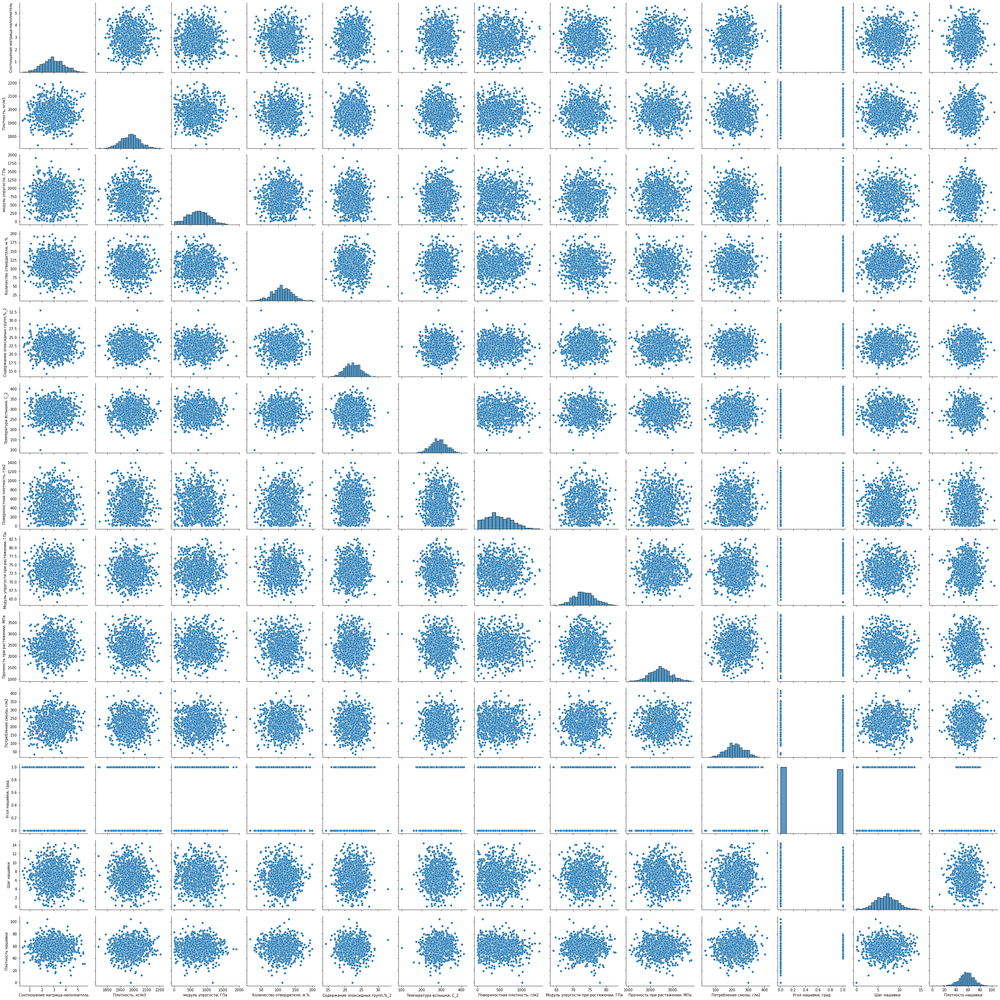

In [22]:
# Вывод парных графиков рассеяния датасета df_s, метод pairplot библиотеки seaborn
sns.pairplot(df_s, height=3)

Вывод: попарные графики рассеяния в целом не показывают какой-либо зависимости между параметрами, имеют вид случайных данных с нормальным распределением, кроме данных столбца 'Угол нашивки', который является категориальной переменной и имеет два ранжированных уровня: 0 и 1, а также столбцов 'Относительное удлинение при растяжении' и 'Относительное удлинение'. Столбец 'Относительное удлинение при растяжении' показывает линейную связь со столбцом 'Прочность при растяжении, МПа'

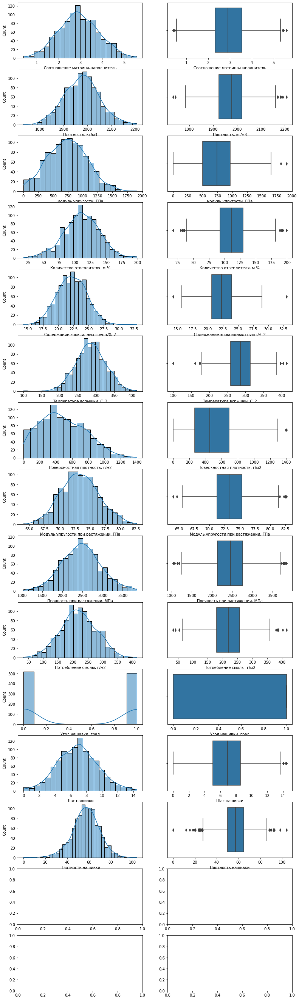

In [23]:
# Построение графиков распределения переменных и "ящики с усами", метод subplots  библиотеки seaborn
fig, axes = plt.subplots(15, 2, figsize=(13, 48))
for k, column in enumerate(df_s.columns):    
    sns.histplot(data=df_s, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df_s, x=column, ax=axes[k, 1])
plt.show()

Вывод: на первый взгляд, судя по графикам распределения переменных параметров близки к нормальным, кроме 'модуль упругости, ГПа', 'Поверхностная плотность, г/м2', 'Угол нашивки'. Судя по графикам рассеяния и графикам "ящики с усами", имеются выбросы.

Требуется дополнительно оценить нормальность распределения параметров по статистическому критерию.

Требуется оценить также корреляцию параметров между собой, а для параметров, имеющих статистически значимую корреляцию, выполнить построение модели статистической регрессии и оценить ее статистическую адекватность.

Требуется произвести сравнение двух групп данных по столбцу 'Угол нашивки' для оценки влияния этого категориального параметра на  количественные параметры датасета.

Требуется очистить данные от выбросов

###### Создание датасета с исключенным категориальным параметром

In [24]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Параметр 'Угол нашивки' - категориальный, поэтому требуется его исключение при оценке нормальности распределения и для построения матрицы корреляции по критерию Пирсона

In [25]:
# Создание нового датасета df_d без столбца 'Угол нашивки'
df_d=df_s[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]

In [26]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Вывод: столбец 'Угол нашивки, град' в датасете df_d отсутствует

### 2. Оценка нормальности распределения параметров

In [27]:
# Описательная статистика датасета df_d, метод describe()
df_d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,14.440522,103.988901


In [28]:
# Описательная статистика датасета df_d, метод describe() библиотеки scipy.stats
stats.describe(df_d)

DescribeResult(nobs=1023, minmax=(array([3.89402605e-01, 1.73176464e+03, 2.43690875e+00, 1.77402746e+01,
       1.42549855e+01, 1.00000000e+02, 6.03739925e-01, 6.40540606e+01,
       1.03685661e+03, 3.38030255e+01, 0.00000000e+00, 0.00000000e+00]), array([   5.5917416 , 2207.77348061, 1911.536477  ,  198.95320719,
         33.        ,  413.27341824, 1399.54236234,   82.68205104,
       3848.43673188,  414.59062836,   14.44052188,  103.9889013 ])), mean=array([   2.93036577, 1975.73488811,  739.92323276,  110.57076865,
         22.24438955,  285.88215135,  482.73183304,   73.32857125,
       2466.9228427 ,  218.42314368,    6.89922208,   57.15392943]), variance=array([8.33974853e-01, 5.43599944e+03, 1.09052897e+05, 8.00658596e+02,
       5.79028591e+00, 1.67635054e+03, 7.91379549e+04, 9.72805426e+00,
       2.35834560e+05, 3.56838144e+03, 6.57136343e+00, 1.52546430e+02]), skewness=array([ 0.08215047,  0.05854323,  0.11999728, -0.08607033,  0.05417838,
       -0.05644348,  0.39488586,  

In [29]:
# Описательная статистика в упорядоченном виде по столбцам датасета df_d
for col in df_d.columns:
    med = statistics.median(df_d[col])
    mean = statistics.mean(df_d[col])
    mod = statistics.mode(df_d[col])
    std = statistics.stdev(df_d[col])
    var = statistics.variance(df_d[col])
    skew = stats.skew(df_d[col])
    kurt = stats.kurtosis(df_d[col])
    max_ = (df_d[col]).max()
    min_ = (df_d[col]).min()
    scope = (df_d[col]).max() - (df_d[col]).min()
    confidence = stats.norm.interval(alpha=0.95, loc=np.mean(df_d[col]), scale=stats.sem(df_d[col]))
    print('\n \t', col, ': \t \n'   'Среднее: ', mean, '\t' 'Медиана: ', med, '\t' 'Мода : ', mod, 
          '\n' 'Стандарт : ', std, '\t' 'Дисперсия: ', var, 
          '\n' 'Асимметрия: ', skew, '\t' 'Эксцесс: ', kurt, 
          '\n' 'Минимум: ', min_, '\t' 'Максимум: ', max_, '\t' 'Размах: ', scope, 
          '\n' 'ДоверитИнтервалСредн: ', confidence) 



 	 Соотношение матрица-наполнитель : 	 
Среднее:  2.9303657734325483 	Медиана:  2.90687765033521 	Мода :  1.85714285714285 
Стандарт :  0.9132222362148388 	Дисперсия:  0.8339748527172307 
Асимметрия:  0.08215047390733503 	Эксцесс:  -0.20422037310846086 
Минимум:  0.389402605178414 	Максимум:  5.59174159869754 	Размах:  5.202338993519127 
ДоверитИнтервалСредн:  (2.8744046078183585, 2.9863269390467426)

 	 Плотность, кг/м3 : 	 
Среднее:  1975.7348881101545 	Медиана:  1977.62165679058 	Мода :  2030.0 
Стандарт :  73.72923055065388 	Дисперсия:  5435.999437591473 
Асимметрия:  0.05854323312878896 	Эксцесс:  0.05745882123102097 
Минимум:  1731.764635096 	Максимум:  2207.77348061119 	Размах:  476.00884551518993 
ДоверитИнтервалСредн:  (1971.2168491073446, 1980.252927112965)

 	 модуль упругости, ГПа : 	 
Среднее:  739.9232327560723 	Медиана:  739.664327697792 	Мода :  738.736842105263 
Стандарт :  330.23158056102693 	Дисперсия:  109052.89679983404 
Асимметрия:  0.11999727729086174 	Эксцесс: 

Вывод: по всем столбцам средние значения укладываются в доверительные интервалы для средних, мода смещена для некоторых параметров, стандартное отклонение имеет порядок ниже размаха, асимметрия и эксцесс близки к нормальным (близки к 0). Распределение параметров, кроме вышеуказанных имеет статистические оценки близкие к нормальным.

ПРИМЕЧАНИЕ: оценка эксцесса scipy.stats.kurtosis рассчитывается по формуле, из которой вычитается 3, чтобы упростить сравнение с нормальным распределением

Тест д'Агостино (по имени Ralph D’Agostino) вычисляет итоговую статистику на основе распределения( эксцесс и асимметрия), чтобы определить, отклоняется ли рассматриваемое распределение данных от нормального, задан уровень значимости 0,05.

Параметр 'Угол нашивки, град' изначально не имеет нормального распределения, поэтому по нему не рассчитывается тест д'Агостино.

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [30]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.084, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=0.824, p-value=0.662
модуль упругости, ГПа : 	 	 	Statistics=4.556, p-value=0.103
Количество отвердителя, м.% : 	 	 	Statistics=2.223, p-value=0.329
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.629, p-value=0.730
Температура вспышки, С_2 : 	 	 	Statistics=2.018, p-value=0.365
Поверхностная плотность, г/м2 : 	 	 	Statistics=38.511, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.946, p-value=0.139
Прочность при растяжении, МПа : 	 	 	Statistics=1.109, p-value=0.574
Потребление смолы, г/м2 : 	 	 	Statistics=0.645, p-value=0.724
Шаг нашивки : 	 	 	Statistics=1.785, p-value=0.410
Плотность нашивки : 	 	 	Statistics=25.992, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вс

Вывод: по тесту по д'Агостино параметры 'Поверхностная плотность, г/м2' и 'Плотность нашивки' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

Критерий Шапиро-Уилка применяется для выборок до 5000 наблюдений, поэтому может быть применен и здесь

In [31]:
# Количество наблюдений, метод shape
df_d.shape[0]

1023

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [32]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.709
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Модуль упруго

Вывод: по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05).

Критерий  Шапиро-Уилка является более чувствительным, чем критерий д'Агостино, и показал, что параметр 'модуль упругости, ГПа' не подчиняется нормальному распределению, так же, как и параметры 'Поверхностная плотность' и 'Плотность нашивки'

### 3. Оценка корреляции параметров

Корреляция для количественных параметров и количественно-категориальных оценивается по критериям Пирсона и Спирмена соответственно

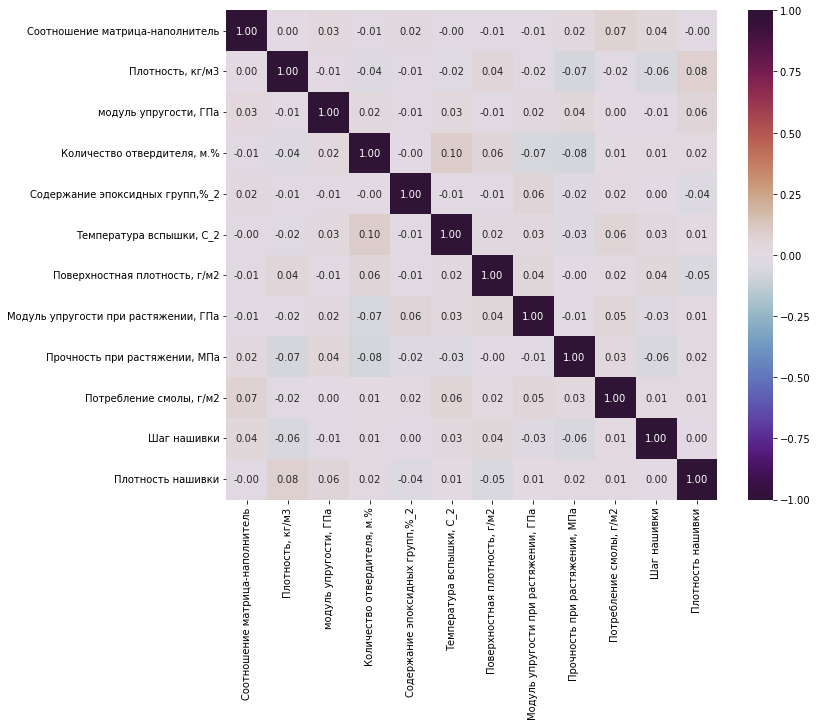

In [33]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Вывод: судя по матрице корреляции, построенной на основании корреляции по Пирсону для количественных данных, коэффициенты корреляции малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа'  (они детерминированные), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между всеми количественными параметрами.

In [34]:
# Вывод сведений о названиях столбцов датасета df_d, метод columns
df_d.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [35]:
# Проверка по критерию Пирсона
count = 0 
for col in df_d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_d[col], df_d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
            # print(f'Наименование колонок и строк БЕЗ корреляции: ')
            # print(col, ' & ', col1)
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.073, p-value=0.020



2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.025



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

3
модуль упругости, ГПа










4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.095, p-value=0.002


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.066, p-value=0.035

Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.075, p-value=0.016




5
Содержани

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016           

Учитывая, что присутствует порядковый ранжированный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

In [36]:
# ранговая корреляция Спирмена с учетом того, что присутствует категориальный параметр 'Угол нашивки'
df_s.corr(method='spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236


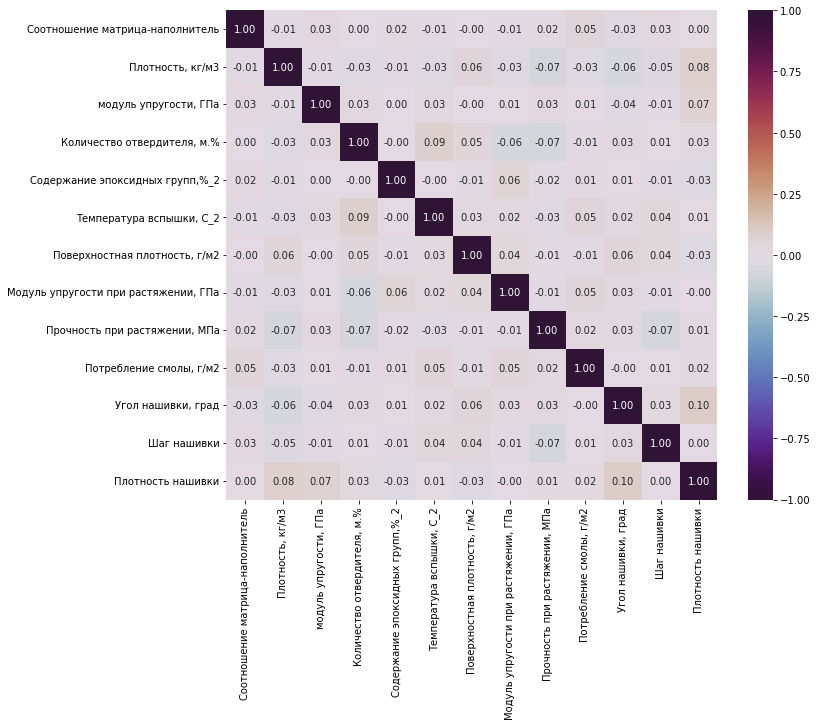

In [37]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(df_s.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

Вывод: судя по матрице корреляции, построенной на основании корреляции по Спирмену для количественных и качественных данных, коэффициенты корреляцим малы, поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между категориальным параметром 'Угол нашивки, град' и остальными параметрами

In [38]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [39]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_s['Угол нашивки, град'] , df_s[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'модуль упругости, ГПа', 'Количество отверд

Вывод: существует статистически значимая попарная корреляционная связь по критерию Спирмена между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'.

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

In [40]:
# Проверка по критерию Спирмена
count = 0 
for col in df_s.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_s.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_s[col], df_s[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.064, p-value=0.040

Наименование колонок и строк С корреляцией: 
Колич

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020

### 4. Статистическое сравнение 2-х групп (углы нашивки 0 и 90 град)

In [41]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

Непараметрический критерий Манна-Уитни сравнения двух групп применяется для малых выборок (n < 30)

Статистическое сравнение 2х групп (углы нашивки, ранги 0 и 1) возможно осуществить по непараметрическому критерию Колмогорова-Смирнова. 

Формулировка гипотезы по непараметрическому критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [42]:
# проверка по критерию Коломогорова-Смирнова для одной выборки
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.

Вывод: непараметрический критерий Колмогорова-Смирнова сравнения двух групп из одной выборки для порядковых ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

In [43]:
# проверка по критерию Коломогорова-Смирнова для двух выборок
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    df1=np.array(df_s[df_s['Угол нашивки, град'] == 0][col].dropna())
    df2=np.array(df_s[df_s['Угол нашивки, град'] == 1][col].dropna())
    stat, p = stats.ks_2samp(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.045, p-value=0.668
Плотность, кг/м3 : 	 	 	Statistics=0.076, p-value=0.100
модуль упругости, ГПа : 	 	 	Statistics=0.091, p-value=0.027
Количество отвердителя, м.% : 	 	 	Statistics=0.058, p-value=0.348
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.029, p-value=0.976
Температура вспышки, С_2 : 	 	 	Statistics=0.046, p-value=0.621
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.082, p-value=0.060
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.071, p-value=0.142
Прочность при растяжении, МПа : 	 	 	Statistics=0.049, p-value=0.548
Потребление смолы, г/м2 : 	 	 	Statistics=0.038, p-value=0.839
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.064, p-value=0.230
Плотность нашивки : 	 	 	Statistics=0.212, p-value=0.000

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.

Вывод: критерий Колмогорова-Смирнова сравнения двух групп из двух выборок для категориальных ранговых переменных (углы нашивки имеют ранги 0 и 1), 'Угол нашивки, град' показывает, что не отвергается статистически значимое различие двух групп по углам нашивки для параметров 'модуль упругости, ГПа' и 'Плотность нашивки'.

Подсчет средних значений по вышеуказанным параметрам:

In [44]:
# 'модуль упругости, ГПа' по двум группам
groups_E= df_s.groupby(['Угол нашивки, град'])['модуль упругости, ГПа'].mean()
groups_E

Угол нашивки, град
0    748.17435
1    731.39325
Name: модуль упругости, ГПа, dtype: float64

In [45]:
# 'Плотность нашивки' по двум группам
groups_P= df_s.groupby(['Угол нашивки, град'])['Плотность нашивки'].mean()
groups_P

Угол нашивки, град
0    55.843291
1    58.508864
Name: Плотность нашивки, dtype: float64

Следует выполнить однофакторный анализ для оценки различия средних по двум группам угла нашивки (углы нашивки с рангами 0 и 1)

In [46]:
# Проверка количества уникальных значений в каждом столбце датасета df_s, метод nunique()
df_s.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [47]:
# Вывод сведений о названиях столбцов датасета df_s, метод columns
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [48]:
# Определение уникальных значений в столбце 'Угол нашивки, град' датасета df_s, метод unique()
df_s['Угол нашивки, град'].unique()

array([0, 1])

In [49]:
# Тип данных столбца 'Угол нашивки' датасета df_s, метод dtypes()
df_s.dtypes['Угол нашивки, град']

dtype('int32')

In [50]:
# Определение типа данных столбца 'Угол нашивки, град' датасета df_s, метод type() библиотеки numpy
type(df_s['Угол нашивки, град'][0])

numpy.int32

Тест:

In [51]:
# Создание групп по качественному параметру 'Угол нашивки, град' для проверки равенства 
# средних параметра 'Модуль упругости при растяжении, ГПа' по этим двум группам
group1 = df_s[df_s['Угол нашивки, град'] == 0]['Модуль упругости при растяжении, ГПа']
group2 = df_s[df_s['Угол нашивки, град'] == 1]['Модуль упругости при растяжении, ГПа']

In [52]:
# Тест функции f_oneway библиотеки scipy.stats
f_oneway(group1, group2)

F_onewayResult(statistic=0.5405592920742476, pvalue=0.4623698756783441)

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [53]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_s.columns[:10]:
    alpha = 0.05
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))
for col in df_s.columns[11:]:
    alpha = 0.05
    group1 = df_s[df_s['Угол нашивки, град'] == 0][col]
    group2 = df_s[df_s['Угол нашивки, град'] == 1][col]
    stat1, bart_test = stats.bartlett(group1, group2)
    stat2, fish_test = f_oneway(group1, group2)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))


Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=1.357, p-value=0.244
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.987, p-value=0.321
Плотность, кг/м3 : 	 	 	Statistics Bartlet=0.172, p-value=0.678
Плотность, кг/м3 : 	 	 	Statistics F-test=4.810, p-value=0.029
модуль упругости, ГПа : 	 	 	Statistics Bartlet=0.303, p-value=0.582
модуль упругости, ГПа : 	 	 	Statistics F-test=0.660, p-value=0.417
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=0.094, p-value=0.759
Количество отвердителя, м.% : 	 	 	Statistics F-test=1.521, p-value=0.218
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=0.025, p-value=0.875
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.066, p-value=0.797
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=0.219, p-value=0.640
Температура вспышки, С_2 : 	 	 	Statistics F-test=0.437, p-value=0.509
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=0.125, p-value=0.724
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: различаются средние для 'Плотность, кг/м3', 'Плотность нашивки'. Но Bartlet-test для 'Плотность нашивки' показывает, что группы имеют не равные дисперсии для плотности нашивки, поэтому F-test не может быть применен для 'Плотность нашивки'

Вывод: создается впечатление малого влияния категориального параметра 'Угол нашивки, град' на датасет в целом

###### Очистка данных от выбросов: 

In [54]:
# Вывод сведений о датасете df_s, метод info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

Вывод: датасет качественный, очистка данных от выбросов на данномф этапе анализа не осуществляется с целью максимального сохранения исходных данных

### 5. Построение моделей статистической регрессии

In [55]:
# Загрузка библиотек sklearn для проведения регрессионного анализа
import sklearn.linear_model as lm
import statsmodels.formula.api as smf

###### Предварительное рассмотрение парной регрессионной модели

Выше было установлено, что статистически значимыми по критерию Пирсона являются следующие попарные корреляции между количественными параметрами:


    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 	 		Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : 	 		Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : 	 	Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : 	 		Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 	 		Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 	 		Statistics=-0.075, p-value=0.016
   
        
Статистически значимой является также попарная корреляционная связь по критерию Спирмена между количественными и ранговым параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', 'Угол нашивки, град' и 'Плотность нашивки'.

Ниже следует рассмотреть модели статистической регрессии для 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%', 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Прочность при растяжении, МПа' от ' Плотность, кг/м3'

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%' 

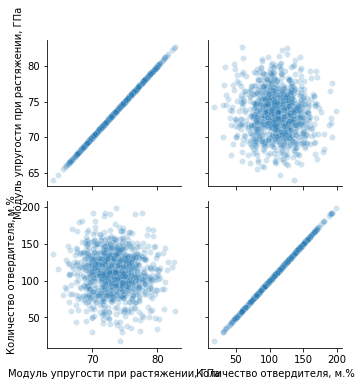

In [56]:
# Анализ взаимосвязи двух числовых переменных - 'Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%' 
columns = ['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [57]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%']]
# Замена названий столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['modul_elas','quant_hard'], axis = 'columns')
ff

,modul_elas,quant_hard
0,70.000000,30.000000
1,70.000000,50.000000
2,70.000000,49.900000
3,70.000000,129.000000
4,70.000000,111.860000
...,...,...
1018,73.090961,86.992183
1019,72.920827,145.981978
1020,74.734344,110.533477
1021,74.042708,141.397963


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


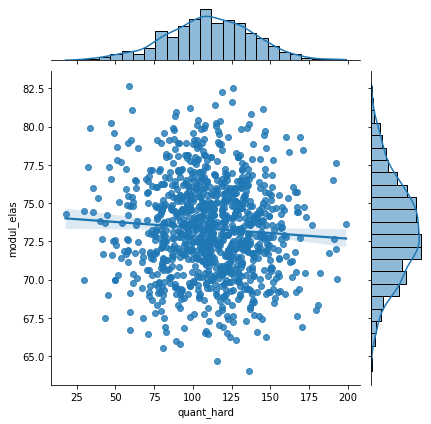

In [58]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('quant_hard', 'modul_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии: 

H0: R-квадрат = 0, 

H1: R-квадрат не равен 0.

Используется OLS-модель:

In [59]:
# Создание OLS-модели
results = smf.ols('modul_elas ~ quant_hard', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             modul_elas   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     4.457
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0350
Time:                        11:23:16   Log-Likelihood:                -2612.5
No. Observations:                1023   AIC:                             5229.
Df Residuals:                    1021   BIC:                             5239.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     74.1321      0.393    188.701      0.000      73.361      74.903
quant_hard    -0.0073      0.003     -2.111      0.035      -0.014      -0.001
==============================================================================
Omnibus:                        3.485   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.175   Jarque-Bera (JB):                3.481
Skew:                           0.117   Prob(JB):                        0.175
Kurtosis:                       2.836   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.004. 

Уравнение вида: 'modul_elas' = 74.1321 - 0.0073*'quant_hard'.

Число степеней свободы: параметров - 1021, модели - 1.

Параметр 'Количество отвердителя, м.%' (quant_hard) - оказался значимым параметром.

F-statistic: 4.457. Prob (F-statistic): 0.0350. Prob(JB): 0.175 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.004

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\1022247960.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


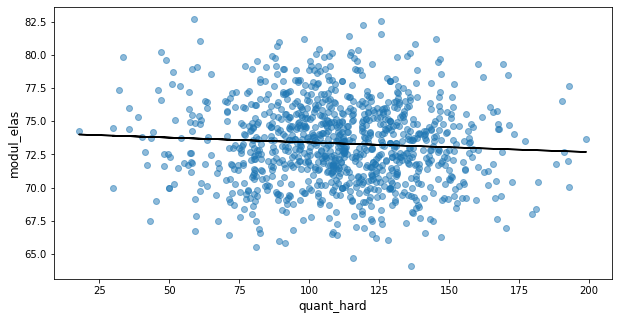

In [60]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['quant_hard']
y = y_line(results.params['Intercept'], results.params['quant_hard'])
ax.plot(ff['quant_hard'], y, color='black')
ax.scatter(ff['quant_hard'], ff['modul_elas'], alpha=.5)
ax.set_xlabel('quant_hard', fontsize=12)
ax.set_ylabel('modul_elas', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Модуль упругости при растяжении, ГПа' от'Количество отвердителя, м.%'.

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа','Количество отвердителя, м.%'

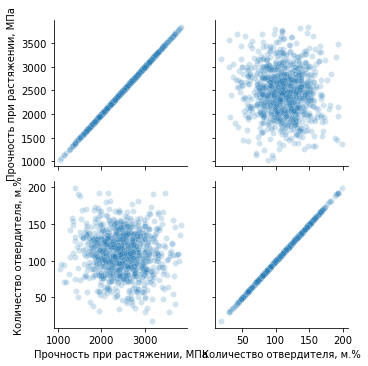

In [61]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа','Количество отвердителя, м.%'
columns = ['Прочность при растяжении, МПа','Количество отвердителя, м.%']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [62]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Количество отвердителя, м.%']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','quant_hard'], axis = 'columns') 
ff

,solid_elas,quant_hard
0,3000.000000,30.000000
1,3000.000000,50.000000
2,3000.000000,49.900000
3,3000.000000,129.000000
4,3000.000000,111.860000
...,...,...
1018,2387.292495,86.992183
1019,2360.392784,145.981978
1020,2662.906040,110.533477
1021,2071.715856,141.397963


График парной регрессии с указанием разбросов данных.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


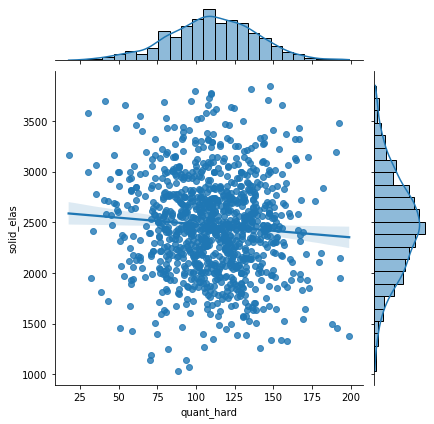

In [63]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('quant_hard', 'solid_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии:

H0: R-квадрат = 0, H1: R-квадрат не равен 0.

Используется OLS-модель:

In [64]:
# Создание OLS-модели
results = smf.ols('solid_elas ~ quant_hard', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     5.834
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0159
Time:                        11:23:18   Log-Likelihood:                -7775.9
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2609.9595     61.127     42.697      0.000    2490.011    2729.908
quant_hard    -1.2936      0.536     -2.415      0.016      -2.345      -0.243
==============================================================================
Omnibus:                        1.369   Durbin-Watson:                   1.919
Prob(Omnibus):                  0.504   Jarque-Bera (JB):                1.276
Skew:                           0.083   Prob(JB):                        0.528
Kurtosis:                       3.048   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.006. 

Уравнение вида: 'solid_elas' = 2609.9595 - 1.2936*'quant_hard'.

Число степеней свободы: параметров - 2021, модели - 1. 

Параметр 'Количество отвердителя, м.%' (quant_hard) оказался значимым параметром.

F-statistic: 5.834. Prob (F-statistic): 0.0159, Prob(JB): 0.528 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.006


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\38544018.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


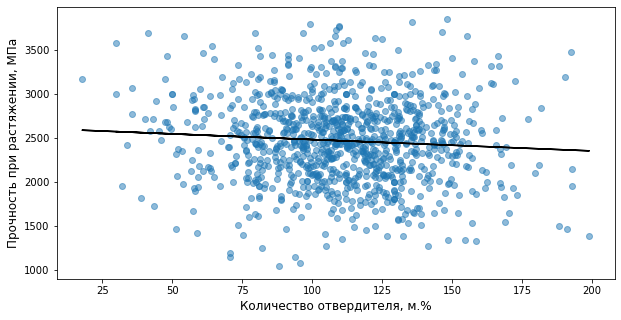

In [65]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['quant_hard']
y = y_line(results.params['Intercept'], results.params['quant_hard'])
ax.plot(ff['quant_hard'], y, color='black')
ax.scatter(ff['quant_hard'], ff['solid_elas'], alpha=.5)
ax.set_xlabel('Количество отвердителя, м.%', fontsize=12)
ax.set_ylabel('Прочность при растяжении, МПа', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%'.

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа','Плотность, кг/м3'

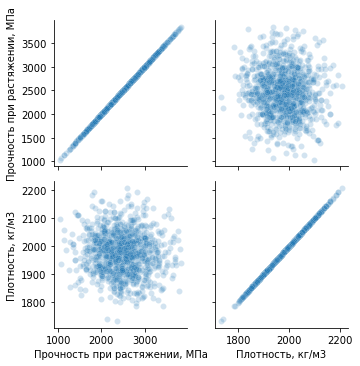

In [66]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа','Плотность, кг/м3'
columns = ['Прочность при растяжении, МПа','Плотность, кг/м3']
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [67]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','density'], axis = 'columns') 
ff

,solid_elas,density
0,3000.000000,2030.000000
1,3000.000000,2030.000000
2,3000.000000,2030.000000
3,3000.000000,2030.000000
4,3000.000000,2030.000000
...,...,...
1018,2387.292495,1952.087902
1019,2360.392784,2050.089171
1020,2662.906040,1972.372865
1021,2071.715856,2066.799773


График парной регрессии с указанием разбросов данных.

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


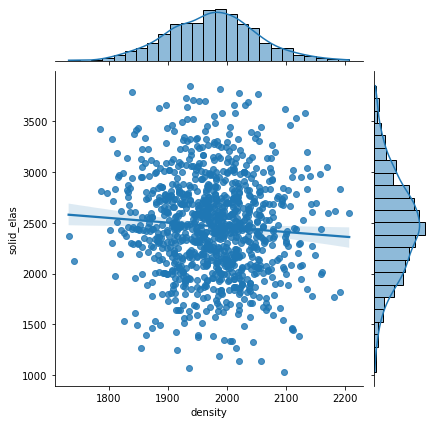

In [68]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('density', 'solid_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии:

H0: R-квадрат = 0, H1: R-квадрат не равен 0.

Используется OLS-модель:

In [69]:
# Создание OLS-модели
results = smf.ols('solid_elas ~ density', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     5.025
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0252
Time:                        11:23:19   Log-Likelihood:                -7776.3
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3377.6186    406.552      8.308      0.000    2579.846    4175.391
density       -0.4609      0.206     -2.242      0.025      -0.864      -0.057
==============================================================================
Omnibus:                        1.352   Durbin-Watson:                   1.918
Prob(Omnibus):                  0.509   Jarque-Bera (JB):                1.291
Skew:                           0.086   Prob(JB):                        0.524
Kurtosis:                       3.023   Cond. No.                     5.30e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.3e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.005. 

Уравнение вида: 'solid_elas' = 3377.6186 - 0.4609*'density'.

Число степеней свободы: параметров - 1021, модели - 1.

Параметр ','Плотность, кг/м3' (density) оказался значимым параметром.

F-statistic: 5.025. Prob (F-statistic): 0.0252, Prob(JB): 0.524 - модель адекватна, но ценность модели невелика, поскольку R-квадрат: 0.005

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\2935229476.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


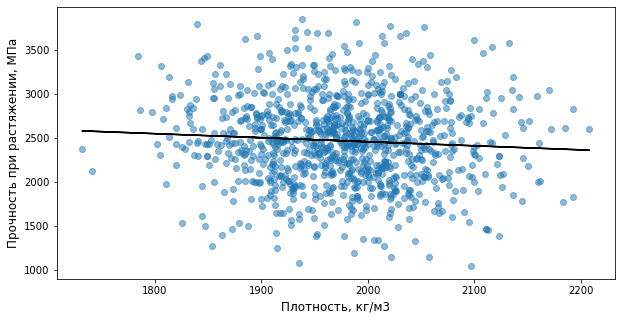

In [70]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['density']
y = y_line(results.params['Intercept'], results.params['density'])
ax.plot(ff['density'], y, color='black')
ax.scatter(ff['density'], ff['solid_elas'], alpha=.5)
ax.set_xlabel('Плотность, кг/м3', fontsize=12)
ax.set_ylabel('Прочность при растяжении, МПа', fontsize=12)

fig.show()

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Плотность, кг/м3'

- Следует рассмотреть взаимосвязь двух числовых переменных - 'Прочность при растяжении, МПа' и 'Модуль упругости при растяжении, ГПа'

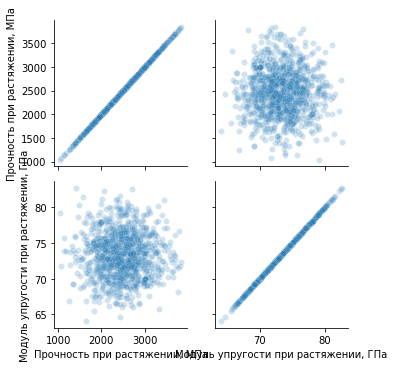

In [71]:
# Анализ взаимосвязи двух числовых переменных - 'Прочность при растяжении, МПа', 'Модуль упругости при растяжении, ГПа'
columns = ['Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа',]
g = sns.PairGrid(df_s[columns])
g.map(sns.scatterplot, alpha=0.2)

In [72]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа']]
# Замена названий столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['strength','modul_elas'], axis = 'columns')
ff

,strength,modul_elas
0,3000.000000,70.000000
1,3000.000000,70.000000
2,3000.000000,70.000000
3,3000.000000,70.000000
4,3000.000000,70.000000
...,...,...
1018,2387.292495,73.090961
1019,2360.392784,72.920827
1020,2662.906040,74.734344
1021,2071.715856,74.042708


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


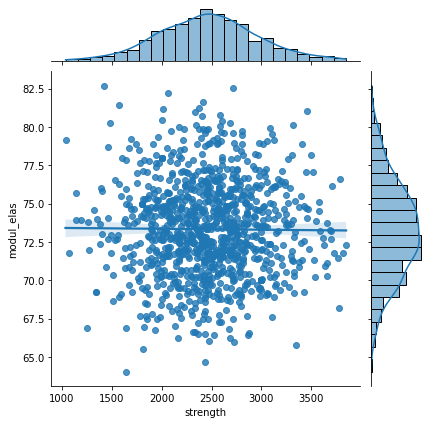

In [73]:
# Создание графика парной регрессии с указанием разбросов данных методом jointplot библиотеки seaborn
sns.jointplot('strength', 'modul_elas', data=ff, kind="reg")

Требуется осуществить проверку критерия адекватности функции регрессии: 

H0: R-квадрат = 0, 

H1: R-квадрат не равен 0.

Используется OLS-модель:

In [74]:
# Создание OLS-модели
results = smf.ols('strength ~ modul_elas', data=ff).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               strength   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.08287
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.774
Time:                        11:23:21   Log-Likelihood:                -7778.7
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1021   BIC:                         1.557e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2569.7794    357.623      7.186      0.000    1868.019    3271.540
modul_elas    -1.4027      4.873     -0.288      0.774     -10.964       8.159
==============================================================================
Omnibus:                        1.108   Durbin-Watson:                   1.916
Prob(Omnibus):                  0.575   Jarque-Bera (JB):                1.062
Skew:                           0.079   Prob(JB):                        0.588
Kurtosis:                       3.014   Cond. No.                     1.73e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.73e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: Модель OLS с расчетом статистик. Метод: Least Squares (МНК). R-квадрат: 0.000. 

Модель неадекватна, параметр незначим

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\1890912044.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


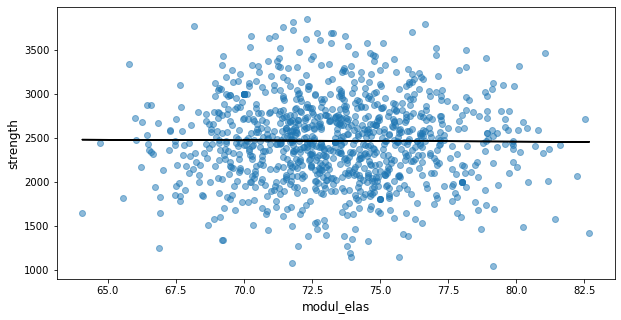

In [75]:
# Построение графика методом subplots библиотеки matplotlib
fig, ax = plt.subplots(figsize=(10, 5))

y_line = lambda a, b: a + b * ff['modul_elas']
y = y_line(results.params['Intercept'], results.params['modul_elas'])
ax.plot(ff['modul_elas'], y, color='black')
ax.scatter(ff['modul_elas'], ff['strength'], alpha=.5)
ax.set_xlabel('modul_elas', fontsize=12)
ax.set_ylabel('strength', fontsize=12)

fig.show()

Вывод: методами статистического анализа не удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Модуль упругости при растяжении, ГПа'. Изначально связь между этими параметрами являлась статистически незначимой

Следует также рассмотреть множественную регрессию

###### Множественная регрессия (OLS)

- Следует рассмотреть взаимосвязь числовых переменных: 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

In [76]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Прочность при растяжении, МПа','Количество отвердителя, м.%', 'Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['solid_elas','quant_hard', 'density'], axis = 'columns') 
ff

,solid_elas,quant_hard,density
0,3000.000000,30.000000,2030.000000
1,3000.000000,50.000000,2030.000000
2,3000.000000,49.900000,2030.000000
3,3000.000000,129.000000,2030.000000
4,3000.000000,111.860000,2030.000000
...,...,...,...
1018,2387.292495,86.992183,1952.087902
1019,2360.392784,145.981978,2050.089171
1020,2662.906040,110.533477,1972.372865
1021,2071.715856,141.397963,2066.799773


Множественная регрессия (OLS)

In [77]:
# Создание OLS-модели
resultsm = smf.ols('solid_elas ~ quant_hard + density', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             solid_elas   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     5.658
Date:                Tue, 25 Apr 2023   Prob (F-statistic):            0.00360
Time:                        11:23:21   Log-Likelihood:                -7773.1
No. Observations:                1023   AIC:                         1.555e+04
Df Residuals:                    1020   BIC:                         1.557e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3562.0617    412.149      8.643      0.000    2753.305    4370.818
quant_hard    -1.3385      0.535     -2.503      0.012      -2.388      -0.289
density       -0.4794      0.205     -2.336      0.020      -0.882      -0.077
==============================================================================
Omnibus:                        1.580   Durbin-Watson:                   1.922
Prob(Omnibus):                  0.454   Jarque-Bera (JB):                1.476
Skew:                           0.089   Prob(JB):                        0.478
Kurtosis:                       3.057   Cond. No.                     5.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Вывод: параметры значимы, модель адекватна. solid_elas = 3562.0617 - 1.3385 * quant_hard - 0.4794 * density.

('Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3').

Поскольку R-квадрат: 0.011, ценность подобной модели невелика.

Следует оценить прогнозирующую способность модели: 

In [78]:
# Выбор модели линейной регрессии
LR = lm.LinearRegression()

In [79]:
# Указание независимых переменных
X=ff[['quant_hard','density']]

In [80]:
# Указание зависимой переменной
mod_m = LR.fit(X,ff[['solid_elas']])

In [81]:
# Расчет коэффициентов регрессии
mod_m.intercept_, mod_m.coef_

(array([3562.06173355]), array([[-1.33847829, -0.47938735]]))

In [82]:
# Определение R-squared
r2 = mod_m.score(X,ff[['solid_elas']])
r2

0.01097173404598939

In [83]:
# Задание аргументов метода predict
x_new_ff = [[50,2030]]

In [84]:
# Прогнозируемое значение
y_new_ff=mod_m.predict(x_new_ff)
print("Прогноз: ",y_new_ff.round(0))

Прогноз:  [[2522.]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Вывод: точность прогноза невелика, значения достаточно близки просто к средним значениям

Вывод: методами статистического анализа удалось доказать регрессионную зависимость 'Прочность при растяжении, МПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

- Следует рассмотреть взаимосвязь числовых переменных: 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

In [85]:
# Создание датасета ff для регрессионного анализа
ff = df_s[['Модуль упругости при растяжении, ГПа','Количество отвердителя, м.%', 'Плотность, кг/м3']]
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['modul_elas','quant_hard', 'density'], axis = 'columns') 
ff

,modul_elas,quant_hard,density
0,70.000000,30.000000,2030.000000
1,70.000000,50.000000,2030.000000
2,70.000000,49.900000,2030.000000
3,70.000000,129.000000,2030.000000
4,70.000000,111.860000,2030.000000
...,...,...,...
1018,73.090961,86.992183,1952.087902
1019,72.920827,145.981978,2050.089171
1020,74.734344,110.533477,1972.372865
1021,74.042708,141.397963,2066.799773


In [86]:
# Создание OLS-модели
resultsm = smf.ols('modul_elas ~ quant_hard + density', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             modul_elas   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     2.432
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0884
Time:                        11:23:21   Log-Likelihood:                -2612.3
No. Observations:                1023   AIC:                             5231.
Df Residuals:                    1020   BIC:                             5245.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     75.8121      2.655     28.550      0.000      70.601      81.023
quant_hard    -0.0073      0.003     -2.132      0.033      -0.014      -0.001
density       -0.0008      0.001     -0.640      0.523      -0.003       0.002
==============================================================================
Omnibus:                        3.393   Durbin-Watson:                   1.965
Prob(Omnibus):                  0.183   Jarque-Bera (JB):                3.403
Skew:                           0.117   Prob(JB):                        0.182
Kurtosis:                       2.841   Cond. No.                     5.40e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.4e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Параметр 'density' незначим, модель неадекватна, R-квадрат = 0,005

Вывод: методами статистического анализа не удалось доказать регрессионную зависимость 'Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%' и 'Плотность, кг/м3'.

###### Анализ общей модели множественной регрессии на неочищенных и очищенных от выбросов данных

- Данные не очищены от выбросов

In [87]:
# Вывод названий столбцов датасета df_s
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [88]:
# Вывод первых пяти строк датасета df_s
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [89]:
# Тип данных столбца 'Угол нашивки, град' датасета df_s, метод dtypes()
df_s['Угол нашивки, град'] = df_s['Угол нашивки, град'].astype(int)
df_s.dtypes['Угол нашивки, град']

dtype('int32')

Следует рассмотреть модель множественной регрессии с учетом всех факторов:

In [90]:
# Создание нового датасета ff для модели множественной регрессии
ff = df_s
# Замена названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns')
ff.head()

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


Необходимо также учесть влияние категориальных переменных.

In [91]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\4291356752.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0,1,0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0


Параметры 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' ('col3' и 'col8') связаны с параметрами 'Относительное удлинение при растяжении' и 'Относительное удлинение' ('col14' и 'col15'), поэтому последние не включаются в рассматриваемую ниже модель:

In [92]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.364
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.177
Time:                        11:23:22   Log-Likelihood:                -2606.5
No. Observations:                1023   AIC:                             5239.
Df Residuals:                    1010   BIC:                             5303.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.4831      3.065     23.976      0.000      67.469      79.497
col1          -0.0393      0.107     -0.367      0.714      -0.250       0.171
col2          -0.0010      0.001     -0.714      0.475      -0.004       0.002
col3           0.0002      0.000      0.806      0.421      -0.000       0.001
col4          -0.0083      0.003     -2.375      0.018      -0.015      -0.001
col5           0.0738      0.041      1.821      0.069      -0.006       0.153
col6           0.0023      0.002      0.975      0.330      -0.002       0.007
col7           0.0005      0.000      1.330      0.184      -0.000       0.001
col9          -0.0001      0.000     -0.593      0.553      -0.001       0.000
col10          0.0026      0.002      1.586      0.113      -0.001       0.006
col12         -0.0413      0.038     -1.082      0.280      -0.116       0.034
col13          0.0024      0.008      0.301      0.764      -0.013       0.018
col110        -0.1392      0.197     -0.706      0.480      -0.526       0.248
==============================================================================
Omnibus:                        3.586   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.166   Jarque-Bera (JB):                3.478
Skew:                           0.105   Prob(JB):                        0.176
Kurtosis:                       2.806   Cond. No.                     1.05e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, не все параметры значимы, R-квадрат = 0,016, следует оставить значимый параметр 'col4' - 'Количество отвердителя, м.%'.

In [93]:
# Модель OLS парной регрессии col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col4', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     4.457
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0350
Time:                        11:23:22   Log-Likelihood:                -2612.5
No. Observations:                1023   AIC:                             5229.
Df Residuals:                    1021   BIC:                             5239.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     74.1321      0.393    188.701      0.000      73.361      74.903
col4          -0.0073      0.003     -2.111      0.035      -0.014      -0.001
==============================================================================
Omnibus:                        3.485   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.175   Jarque-Bera (JB):                3.481
Skew:                           0.117   Prob(JB):                        0.175
Kurtosis:                       2.836   Cond. No.                         461.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Модель адекватна и параметр 'col4' значим, R-квадрат = 0,004. 

Модель modul_elas = 74.1321 - 0.0073 * quant_hard.

('Модуль упругости при растяжении, ГПа' от 'Количество отвердителя, м.%').

Прогнозирующая способность модели:

In [94]:
# Указание независимой переменной
X=ff[['col4']]

In [95]:
# Указаиние зависимой переменной
mod_m = LR.fit(X,ff[['col8']])

In [96]:
# Расчет коэффициентов линейной регрессии
mod_m.intercept_, mod_m.coef_

(array([74.13210432]), array([[-0.00726714]]))

In [97]:
# Определение R-squared
r2 = mod_m.score(X,ff[['col8']])
r2

0.004346585580664586

In [98]:
# Задание аргументов метода predict
x_new_ff = [[50]]

In [99]:
# Прогнозируемое значение
y_new_ff=mod_m.predict(x_new_ff)
print("Прогноз: ",y_new_ff.round(0))

Прогноз:  [[74.]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


Вывод: точность прогноза невелика, значения достаточно близки к средним значениям

In [100]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.802
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0435
Time:                        11:23:22   Log-Likelihood:                -7767.9
No. Observations:                1023   AIC:                         1.556e+04
Df Residuals:                    1010   BIC:                         1.563e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3941.4164    583.200      6.758      0.000    2796.993    5085.839
col1          12.6778     16.633      0.762      0.446     -19.961      45.317
col2          -0.5111      0.207     -2.465      0.014      -0.918      -0.104
col3           0.0619      0.046      1.347      0.178      -0.028       0.152
col4          -1.3488      0.540     -2.498      0.013      -2.408      -0.289
col5          -4.7370      6.302     -0.752      0.452     -17.104       7.630
col6          -0.3298      0.372     -0.886      0.376      -1.060       0.401
col7           0.0135      0.054      0.249      0.803      -0.093       0.120
col8          -2.8972      4.886     -0.593      0.553     -12.485       6.690
col10          0.2434      0.255      0.956      0.339      -0.256       0.743
col12        -12.2480      5.925     -2.067      0.039     -23.875      -0.621
col13          0.8723      1.242      0.702      0.483      -1.566       3.310
col110       -22.6233     30.625     -0.739      0.460     -82.720      37.473
==============================================================================
Omnibus:                        1.471   Durbin-Watson:                   1.922
Prob(Omnibus):                  0.479   Jarque-Bera (JB):                1.445
Skew:                           0.092   Prob(JB):                        0.486
Kurtosis:                       2.999   Cond. No.                     8.50e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.5e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, но не все параметры значимы, следует оставить значимые параметры: 'col2', 'col4' и 'col12': 'Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки', R-квадрат = 0,021

In [101]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2 + col4 + col12', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     5.150
Date:                Tue, 25 Apr 2023   Prob (F-statistic):            0.00155
Time:                        11:23:22   Log-Likelihood:                -7771.1
No. Observations:                1023   AIC:                         1.555e+04
Df Residuals:                    1019   BIC:                         1.557e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3692.6806    416.551      8.865      0.000    2875.286    4510.075
col2          -0.5045      0.205     -2.458      0.014      -0.907      -0.102
col4          -1.3247      0.534     -2.481      0.013      -2.373      -0.277
col12        -11.9484      5.902     -2.025      0.043     -23.529      -0.368
==============================================================================
Omnibus:                        1.569   Durbin-Watson:                   1.924
Prob(Omnibus):                  0.456   Jarque-Bera (JB):                1.478
Skew:                           0.090   Prob(JB):                        0.477
Kurtosis:                       3.045   Cond. No.                     5.47e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.47e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна и параметры 'col2', 'col4' и 'col12' значимы, R-квадрат = 0,015.

Модель solid_elas = 3692.6806 - 0,5045 * density - 1.3247 * quant_hard - 11.9484 * step.

'Прочность при растяжении, МПа' от 'Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки'.

Прогнозирующая способность модели:

In [102]:
# Вывод названий столбцов датасета df_s
df_s.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

- Данные очищены от выбросов

In [103]:
# Вывод сведений о датасете df_s методом info()
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [104]:
# Вывод первых пяти строк датасета df_s
df_s.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


Очистка данных от выбросов:

Соотношение матрица-наполнитель: 3s=0 iq=6


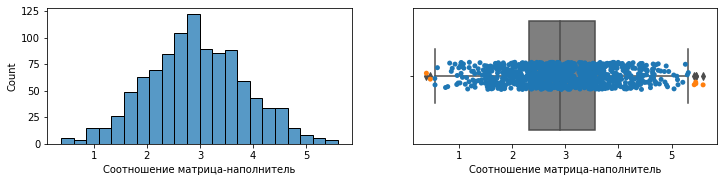

Плотность, кг/м3: 3s=3 iq=9


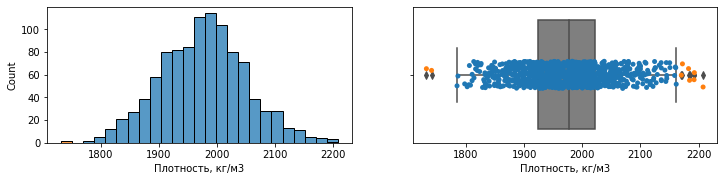

модуль упругости, ГПа: 3s=2 iq=2


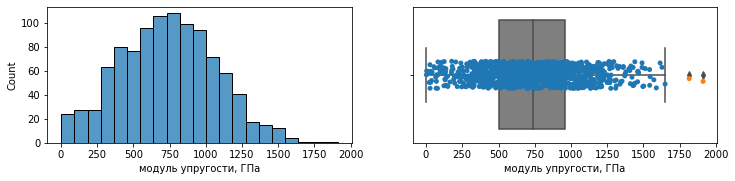

Количество отвердителя, м.%: 3s=2 iq=14


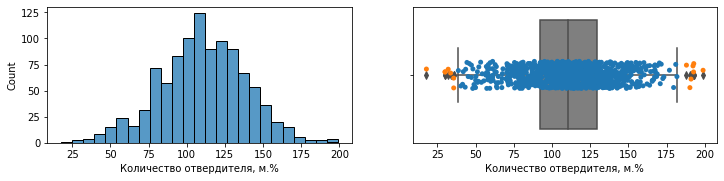

Содержание эпоксидных групп,%_2: 3s=2 iq=2


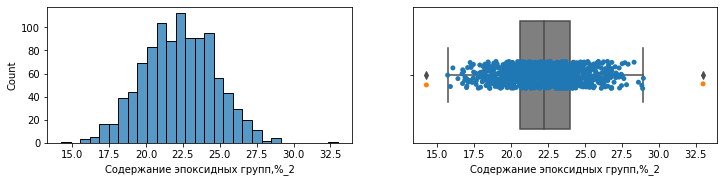

Температура вспышки, С_2: 3s=3 iq=8


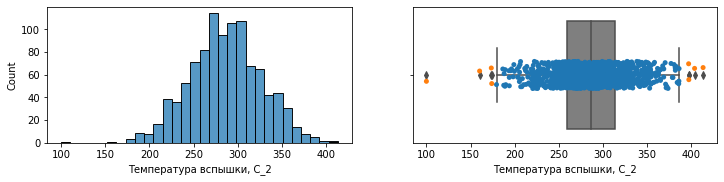

Поверхностная плотность, г/м2: 3s=2 iq=2


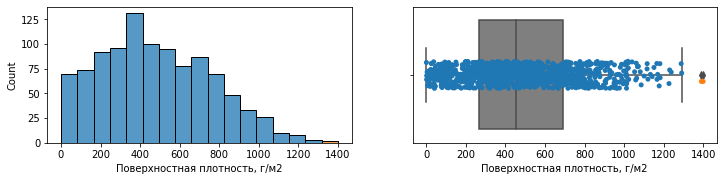

Модуль упругости при растяжении, ГПа: 3s=0 iq=6


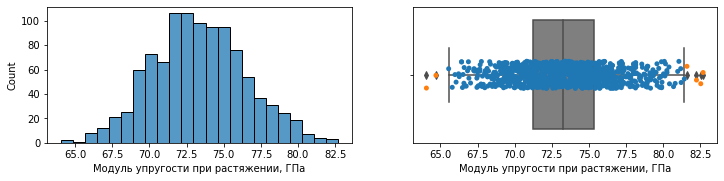

Прочность при растяжении, МПа: 3s=0 iq=11


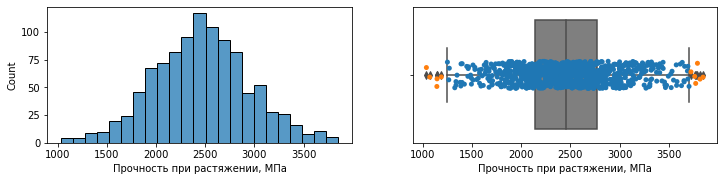

Потребление смолы, г/м2: 3s=3 iq=8


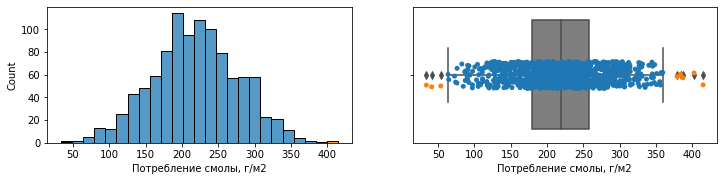

Угол нашивки, град: 3s=0 iq=0


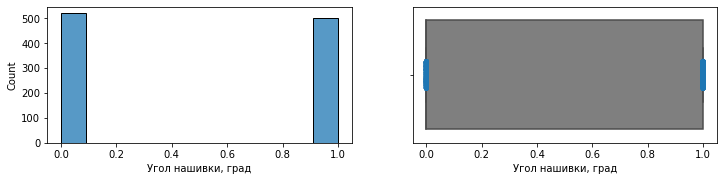

Шаг нашивки: 3s=0 iq=4


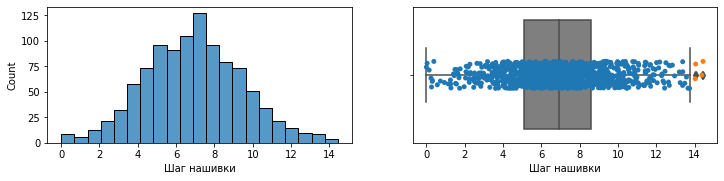

Плотность нашивки: 3s=7 iq=21


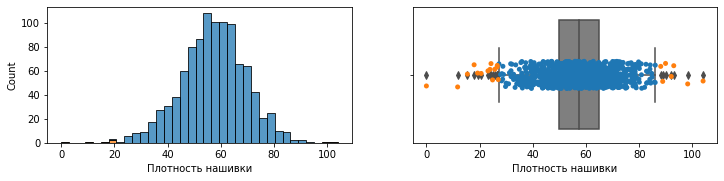

Метод 3-х сигм, выбросов: 24
Метод межквартильных расстояний, выбросов: 93


In [105]:
# Визуализация выбросов
count_3s = 0
count_iq = 0
for column in df_s:
    d = df_s.loc[:, [column]]
    # методом 3-х сигм
    zscore = (df_s[column] - df_s[column].mean()) / df_s[column].std()
    d['3s'] = zscore.abs() > 3
    count_3s += d['3s'].sum()
    # методом межквартильных расстояний
    q1 = np.quantile(df_s[column], 0.25)
    q3 = np.quantile(df_s[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df_s[column] <= lower) | (df_s[column] >= upper)
    count_iq += d['iq'].sum()
    # визуализация выбросов
    print('{}: 3s={} iq={}'.format(column, d['3s'].sum(), d['iq'].sum()))
    fig, axes = plt.subplots(1, 2, figsize=(12, 2.5))
    sns.histplot(data=d, x=column, hue='3s', multiple='stack', legend=False, ax=axes[0])
    sns.boxplot(data=d, x=column, color='tab:gray', ax=axes[1])
    sns.stripplot(data=d[d['iq']==False], x=column, ax=axes[1])
    sns.stripplot(data=d[d['iq']==True], x=column, color='tab:orange', ax=axes[1])
    plt.show()

print('Метод 3-х сигм, выбросов:', count_3s)
print('Метод межквартильных расстояний, выбросов:', count_iq)

- Очистка данных от выбросов методом 3-х сигм:

In [106]:
# Создание нового датасета df для очистки от выбросов методом 3-х сигм и вывод информации о нем
df = df_s.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [107]:
# Удаление выбросов методом 3-х сигм
outliers = pd.DataFrame(index=df.index)
for column in df:
    zscore = (df[column] - df[column].mean()) / df[column].std()
    outliers[column] = (zscore.abs() > 3)
df = df[outliers.sum(axis=1)==0]
df.shape

(1000, 13)

In [108]:
# Вывод сведений о датасете df после очистки методом 3-х сигм
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1000 non-null   float64
 1   Плотность, кг/м3                      1000 non-null   float64
 2   модуль упругости, ГПа                 1000 non-null   float64
 3   Количество отвердителя, м.%           1000 non-null   float64
 4   Содержание эпоксидных групп,%_2       1000 non-null   float64
 5   Температура вспышки, С_2              1000 non-null   float64
 6   Поверхностная плотность, г/м2         1000 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1000 non-null   float64
 8   Прочность при растяжении, МПа         1000 non-null   float64
 9   Потребление смолы, г/м2               1000 non-null   float64
 10  Угол нашивки, град                    1000 non-null   int32  
 11  Шаг нашивки      

In [109]:
# Создание датасета ff для регрессионного анализа
ff = df
# Заменить названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns') 
ff

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


In [110]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\4291356752.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,1,0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,1,0


In [111]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.684
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0652
Time:                        11:23:26   Log-Likelihood:                -2544.2
No. Observations:                1000   AIC:                             5114.
Df Residuals:                     987   BIC:                             5178.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.2544      3.116     23.510      0.000      67.140      79.369
col1          -0.0529      0.109     -0.487      0.626      -0.266       0.160
col2          -0.0011      0.001     -0.819      0.413      -0.004       0.002
col3           0.0002      0.000      0.541      0.589      -0.000       0.001
col4          -0.0096      0.004     -2.697      0.007      -0.017      -0.003
col5           0.0908      0.041      2.203      0.028       0.010       0.172
col6           0.0023      0.002      0.937      0.349      -0.003       0.007
col7           0.0004      0.000      1.003      0.316      -0.000       0.001
col9          -0.0001      0.000     -0.599      0.549      -0.001       0.000
col10          0.0032      0.002      1.929      0.054   -5.59e-05       0.007
col12         -0.0422      0.039     -1.095      0.274      -0.118       0.033
col13          0.0081      0.008      0.967      0.334      -0.008       0.025
col110        -0.1131      0.199     -0.570      0.569      -0.503       0.276
==============================================================================
Omnibus:                        3.489   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.175   Jarque-Bera (JB):                3.457
Skew:                           0.114   Prob(JB):                        0.178
Kurtosis:                       2.825   Cond. No.                     1.06e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.06e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, не все параметры значимы, R-квадрат = 0.021, следует оставить значимый параметры 'col4' - 'Количество отвердителя, м.%' и 'col5' - 'Содержание эпоксидных групп,%_2'

In [112]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col4 + col5', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     5.347
Date:                Tue, 25 Apr 2023   Prob (F-statistic):            0.00490
Time:                        11:23:26   Log-Likelihood:                -2549.0
No. Observations:                1000   AIC:                             5104.
Df Residuals:                     997   BIC:                             5119.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     72.2629      1.000     72.284      0.000      70.301      74.225
col4          -0.0085      0.004     -2.427      0.015      -0.015      -0.002
col5           0.0900      0.041      2.189      0.029       0.009       0.171
==============================================================================
Omnibus:                        3.824   Durbin-Watson:                   1.964
Prob(Omnibus):                  0.148   Jarque-Bera (JB):                3.876
Skew:                           0.136   Prob(JB):                        0.144
Kurtosis:                       2.863   Cond. No.                     1.19e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.19e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметрs 'col4' и 'col5' значимы, R-квадрат = 0,011

In [113]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     1.616
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0815
Time:                        11:23:26   Log-Likelihood:                -7592.9
No. Observations:                1000   AIC:                         1.521e+04
Df Residuals:                     987   BIC:                         1.528e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4008.1105    592.854      6.761      0.000    2844.711    5171.510
col1          13.8582     16.911      0.819      0.413     -19.327      47.044
col2          -0.5802      0.212     -2.739      0.006      -0.996      -0.165
col3           0.0526      0.047      1.121      0.262      -0.039       0.145
col4          -1.0693      0.554     -1.929      0.054      -2.157       0.019
col5          -5.2458      6.438     -0.815      0.415     -17.879       7.387
col6          -0.2052      0.383     -0.536      0.592      -0.956       0.545
col7           0.0011      0.055      0.021      0.984      -0.108       0.110
col8          -2.9728      4.959     -0.599      0.549     -12.704       6.759
col10          0.2191      0.261      0.840      0.401      -0.293       0.731
col12        -11.9080      6.002     -1.984      0.048     -23.687      -0.129
col13          1.3747      1.311      1.048      0.295      -1.198       3.948
col110       -19.0709     30.934     -0.616      0.538     -79.775      41.634
==============================================================================
Omnibus:                        1.838   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.399   Jarque-Bera (JB):                1.802
Skew:                           0.104   Prob(JB):                        0.406
Kurtosis:                       3.004   Cond. No.                     8.54e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.54e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, не все параметры значимы, R-квадрат = 0,019, следует оставить параметры 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%', 'Шаг нашивки '):

In [114]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     6.333
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0120
Time:                        11:23:26   Log-Likelihood:                -7599.5
No. Observations:                1000   AIC:                         1.520e+04
Df Residuals:                     998   BIC:                         1.521e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3507.7172    414.687      8.459      0.000    2693.958    4321.476
col2          -0.5279      0.210     -2.517      0.012      -0.940      -0.116
==============================================================================
Omnibus:                        1.780   Durbin-Watson:                   1.923
Prob(Omnibus):                  0.411   Jarque-Bera (JB):                1.698
Skew:                           0.099   Prob(JB):                        0.428
Kurtosis:                       3.036   Cond. No.                     5.36e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.36e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры значимы, R-квадрат = 0,014

- Очистка данных от выбросов методом квантилей

In [115]:
# Вывод информации о датасете df_s
df_s.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки      

In [116]:
# Создание нового датасета df для очистки методом квартилей
df = df_s.copy()
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [117]:
# Очистка от выбросов методом квартилей
for col in df.columns:
    q75,q25 = np.percentile(df.loc[:,col],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df.loc[df[col] < min,col] = np.nan
    df.loc[df[col] > max,col] = np.nan

In [118]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

Вывод: выбросов не так много, можно их удалить

In [119]:
#Удаление выбросов и вывод первых пяти строк датасета df после удаления выбросов
df = df.dropna(axis=0)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0


In [120]:
# Проверка наличия пропусков NULL и NaN в объекте DataFrame, методы isnull() и sum()
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [121]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки       

In [122]:
# Проверка типа данных столбца 'Угол нашивки, град', метод dtypes()
df.dtypes['Угол нашивки, град']

dtype('float64')

In [123]:
# Изменение типа данных столбца 'Угол нашивки, град', метод astype('int')
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [124]:
# Вывод информации о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int32  
 11  Шаг нашивки       

In [125]:
# Данные очищены межквартильными расстояниями!
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [126]:
# Вывод первых пяти строк датасета df
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0


In [127]:
# Создание датасета ff для регрессионного анализа
ff = df
# Заменить названия столбцов таблицы методом set_axis() для создания OLS-модели
ff = ff.set_axis(['col1','col2','col3','col4','col5','col6','col7','col8','col9','col10','col11','col12','col13'], axis = 'columns') 
ff

,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


In [128]:
# Замена категориальных переменых порядковыми переменными, метод concat, 
# Dummy variables, аргумент get_dummies 
ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)
ff.head()

C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\2949596910.py:3: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  ff = pd.concat((ff,pd.get_dummies(ff.col11, prefix="col11", prefix_sep='',)),1)


,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col110,col111
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0,1,0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0,1,0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0,1,0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0,1,0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0,1,0


In [129]:
# Модель OLS множественной регрессии для параметра col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col9 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.019
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.429
Time:                        11:23:27   Log-Likelihood:                -2361.4
No. Observations:                 936   AIC:                             4749.
Df Residuals:                     923   BIC:                             4812.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     73.6592      3.234     22.776      0.000      67.312      80.006
col1          -0.0845      0.112     -0.755      0.451      -0.304       0.135
col2          -0.0011      0.001     -0.805      0.421      -0.004       0.002
col3           0.0002      0.000      0.745      0.456      -0.000       0.001
col4          -0.0062      0.004     -1.672      0.095      -0.013       0.001
col5           0.0720      0.042      1.732      0.084      -0.010       0.154
col6           0.0012      0.003      0.471      0.638      -0.004       0.006
col7           0.0004      0.000      1.055      0.292      -0.000       0.001
col9        -5.78e-05      0.000     -0.267      0.789      -0.000       0.000
col10          0.0029      0.002      1.701      0.089      -0.000       0.006
col12         -0.0158      0.040     -0.396      0.692      -0.094       0.062
col13          0.0044      0.009      0.493      0.622      -0.013       0.022
col110        -0.1841      0.201     -0.918      0.359      -0.578       0.210
==============================================================================
Omnibus:                        5.686   Durbin-Watson:                   2.058
Prob(Omnibus):                  0.058   Jarque-Bera (JB):                4.938
Skew:                           0.108   Prob(JB):                       0.0847
Kurtosis:                       2.717   Cond. No.                     1.08e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.08e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель неадекватна, параметры незначимы, R-квадрат = 0,012

In [130]:
# Модель OLS парной регрессии col8 - 'Модуль упругости при растяжении, ГПа'
resultsm = smf.ols('col8 ~ col5', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col8   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     2.862
Date:                Tue, 25 Apr 2023   Prob (F-statistic):             0.0910
Time:                        11:23:27   Log-Likelihood:                -2366.1
No. Observations:                 936   AIC:                             4736.
Df Residuals:                     934   BIC:                             4746.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     71.7483      0.926     77.517      0.000      69.932      73.565
col5           0.0701      0.041      1.692      0.091      -0.011       0.151
==============================================================================
Omnibus:                        6.090   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.048   Jarque-Bera (JB):                5.342
Skew:                           0.119   Prob(JB):                       0.0692
Kurtosis:                       2.717   Cond. No.                         209.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Модель адекватна, параметр 'col5 ('Содержание эпоксидных групп,%_2') значим, R-квадрат = 0,005

In [131]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col1 + col2 + col3 + col4 + col5 + col6 + col7 + col8 + col10 + col12 + col13 + col110', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.486
Date:                Tue, 25 Apr 2023   Prob (F-statistic):              0.123
Time:                        11:23:27   Log-Likelihood:                -7065.3
No. Observations:                 936   AIC:                         1.416e+04
Df Residuals:                     923   BIC:                         1.422e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3744.7717    602.934      6.211      0.000    2561.490    4928.053
col1          12.4832     17.048      0.732      0.464     -20.975      45.942
col2          -0.5399      0.216     -2.501      0.013      -0.964      -0.116
col3           0.0539      0.046      1.164      0.245      -0.037       0.145
col4          -1.2038      0.564     -2.135      0.033      -2.310      -0.097
col5          -1.2069      6.338     -0.190      0.849     -13.646      11.232
col6          -0.0181      0.386     -0.047      0.963      -0.776       0.740
col7          -0.0340      0.054     -0.625      0.532      -0.141       0.073
col8          -1.3399      5.011     -0.267      0.789     -11.175       8.495
col10          0.2127      0.263      0.808      0.419      -0.304       0.729
col12        -12.5598      6.048     -2.077      0.038     -24.430      -0.690
col13          0.7209      1.367      0.527      0.598      -1.962       3.404
col110       -17.3692     30.551     -0.569      0.570     -77.327      42.589
==============================================================================
Omnibus:                        3.205   Durbin-Watson:                   1.935
Prob(Omnibus):                  0.201   Jarque-Bera (JB):                3.202
Skew:                           0.115   Prob(JB):                        0.202
Kurtosis:                       2.830   Cond. No.                     8.78e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.78e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры 'col2', 'col3', 'col4' и 'col12' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') значимы, R-квадрат = 0,028:

In [132]:
# Модель OLS множественной регрессии для параметра col9 - 'Прочность при растяжении, МПа'
resultsm = smf.ols('col9 ~ col2 + col4 + col12', data=ff).fit()
resultsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   col9   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     4.646
Date:                Tue, 25 Apr 2023   Prob (F-statistic):            0.00313
Time:                        11:23:27   Log-Likelihood:                -7067.3
No. Observations:                 936   AIC:                         1.414e+04
Df Residuals:                     932   BIC:                         1.416e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3753.5774    433.386      8.661      0.000    2903.053    4604.102
col2          -0.5422      0.213     -2.540      0.011      -0.961      -0.123
col4          -1.1806      0.559     -2.113      0.035      -2.277      -0.084
col12        -12.2759      6.017     -2.040      0.042     -24.084      -0.467
==============================================================================
Omnibus:                        3.079   Durbin-Watson:                   1.937
Prob(Omnibus):                  0.215   Jarque-Bera (JB):                3.094
Skew:                           0.115   Prob(JB):                        0.213
Kurtosis:                       2.838   Cond. No.                     5.69e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.69e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Модель адекватна, параметры 'col2', 'col3', 'col4' и 'col12' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') значимы, R-квадрат = 0.021

ОБЩИЙ ВЫВОД ПО МОДЕЛЯМ РЕГРЕССИИ:

параметр 'col8' ('Модуль упругости при растяжении, ГПа') имеет регрессионную связь с параметром 'col4' ('Количество отвердителя, м.%') до очистки, с параметрами 'col4' и 'col5' ('Количество отвердителя, м.%' и 'Содержание эпоксидных групп,%_2') после очистки методом 3-х сигм и с параметром 'col5' ('Содержание эпоксидных групп,%_2') после квантильной очистки;

параметр 'col9' ('Прочность при растяжении, МПа') имеет регрессионную связь с параметрами 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки') до очистки, с параметрами 'col2', 'col4' и 'col12' ('Плотность, кг/м3', 'Количество отвердителя, м.%' и 'Шаг нашивки') после очистки методом 3-х сигм и с параметрами 'col2', 'col3', 'col4' и 'col14' ('Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%' и 'Шаг нашивки') после квантильной очистки

###### Оценка нормальности распределения параметров датасета после очистки методом квартилей

In [133]:
# Вывод сведений о датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int32  
 11  Шаг нашивки       

Оценка нормальности распределения параметров по статистическому критерию д'Агостино:

In [134]:
# Проверка по критерию д'Агостино
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.normaltest(df_d[col]) # Критерий согласия д'Агостино
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=3.084, p-value=0.214
Плотность, кг/м3 : 	 	 	Statistics=0.824, p-value=0.662
модуль упругости, ГПа : 	 	 	Statistics=4.556, p-value=0.103
Количество отвердителя, м.% : 	 	 	Statistics=2.223, p-value=0.329
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.629, p-value=0.730
Температура вспышки, С_2 : 	 	 	Statistics=2.018, p-value=0.365
Поверхностная плотность, г/м2 : 	 	 	Statistics=38.511, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=3.946, p-value=0.139
Прочность при растяжении, МПа : 	 	 	Statistics=1.109, p-value=0.574
Потребление смолы, г/м2 : 	 	 	Statistics=0.645, p-value=0.724
Шаг нашивки : 	 	 	Statistics=1.785, p-value=0.410
Плотность нашивки : 	 	 	Statistics=25.992, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вс

Вывод: согласно критерию д'Агостино распределение тех же самых параметров до очистки и после очистки статистически значимо не отличается от нормального

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [135]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.998, p-value=0.277
Плотность, кг/м3 : 	 	 	Statistics=0.999, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=0.996, p-value=0.007
Количество отвердителя, м.% : 	 	 	Statistics=0.998, p-value=0.209
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.265
Температура вспышки, С_2 : 	 	 	Statistics=0.998, p-value=0.283
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.998, p-value=0.174
Прочность при растяжении, МПа : 	 	 	Statistics=0.998, p-value=0.221
Потребление смолы, г/м2 : 	 	 	Statistics=0.999, p-value=0.709
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.176
Плотность нашивки : 	 	 	Statistics=0.993, p-value=0.000

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Модуль упруго

Вывод: согласно критерию Шапиро-Уилка распределение тех же самых параметров до очистки и после очистки статистически значимо не отличается от нормального, критерий Шапиро-Уилка оказался более чувствительным и позволил установить, что параметр 'модуль упругости, ГПа' статистически значимо отличается от нормального, см. также ниже попарные графики рассеяния после нормализации

###### Подготовка к нормализации датасета

In [136]:
# Вывод информации о датасете df для подготовки к нормализации датасета df
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int32  
 11  Шаг нашивки       

In [137]:
# Значения параметра в колонке
df['Угол нашивки, град'].unique()

array([0, 1])

Примечание.

Квартильная очистка df от выбросов не требуется, датасет уже был очищен ранее при построении моделей регрессии

In [138]:
# Описательная статистика датасета df_d, метод describe()
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,2.925683,1974.040023,738.247627,110.916216,22.209030,286.040414,482.993901,73.305127,2467.488822,217.613374,0.511752,6.915585,57.451895
std,0.893712,70.808120,328.708665,27.037891,2.394871,39.400677,280.190377,3.037381,463.838911,57.827255,0.500129,2.509672,11.239331
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.553336,1250.392802,63.685698,0.000000,0.037639,27.272928
25%,2.321931,1923.443748,498.577158,92.523816,20.571516,259.184486,266.004099,71.248823,2146.936034,179.489091,0.000000,5.134988,50.209656
50%,2.904731,1977.258043,738.736842,111.113175,22.184713,286.024118,457.732246,73.259230,2457.959767,218.388715,1.000000,6.943337,57.584225
75%,3.546650,2020.158764,958.418993,130.001450,23.961818,312.991425,695.900862,75.310788,2755.169485,256.396777,1.000000,8.591450,64.798211
max,5.314144,2161.565216,1649.415706,181.828448,28.955094,386.067992,1291.340115,81.417126,3705.672523,359.052220,1.000000,13.732404,86.012427


In [140]:
# Создание нового датасета df_d без столбца 'Угол нашивки, град'
df_d=df[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]
df_d.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,70.0


In [141]:
# Описательная статистика датасета df_d, метод describe()
df_d.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,2.925683,1974.040023,738.247627,110.916216,22.209030,286.040414,482.993901,73.305127,2467.488822,217.613374,6.915585,57.451895
std,0.893712,70.808120,328.708665,27.037891,2.394871,39.400677,280.190377,3.037381,463.838911,57.827255,2.509672,11.239331
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.553336,1250.392802,63.685698,0.037639,27.272928
25%,2.321931,1923.443748,498.577158,92.523816,20.571516,259.184486,266.004099,71.248823,2146.936034,179.489091,5.134988,50.209656
50%,2.904731,1977.258043,738.736842,111.113175,22.184713,286.024118,457.732246,73.259230,2457.959767,218.388715,6.943337,57.584225
75%,3.546650,2020.158764,958.418993,130.001450,23.961818,312.991425,695.900862,75.310788,2755.169485,256.396777,8.591450,64.798211
max,5.314144,2161.565216,1649.415706,181.828448,28.955094,386.067992,1291.340115,81.417126,3705.672523,359.052220,13.732404,86.012427


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [142]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_d.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_d[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.087
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.095
модуль упругости, ГПа : 	 	 	Statistics=0.995, p-value=0.006
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.025
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.236
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.085
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.023
Прочность при растяжении, МПа : 	 	 	Statistics=0.997, p-value=0.078
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.016
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.349
Плотность нашивки : 	 	 	Statistics=0.997, p-value=0.052

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Прочность при растяжении, МПа', 'Шаг нашивки

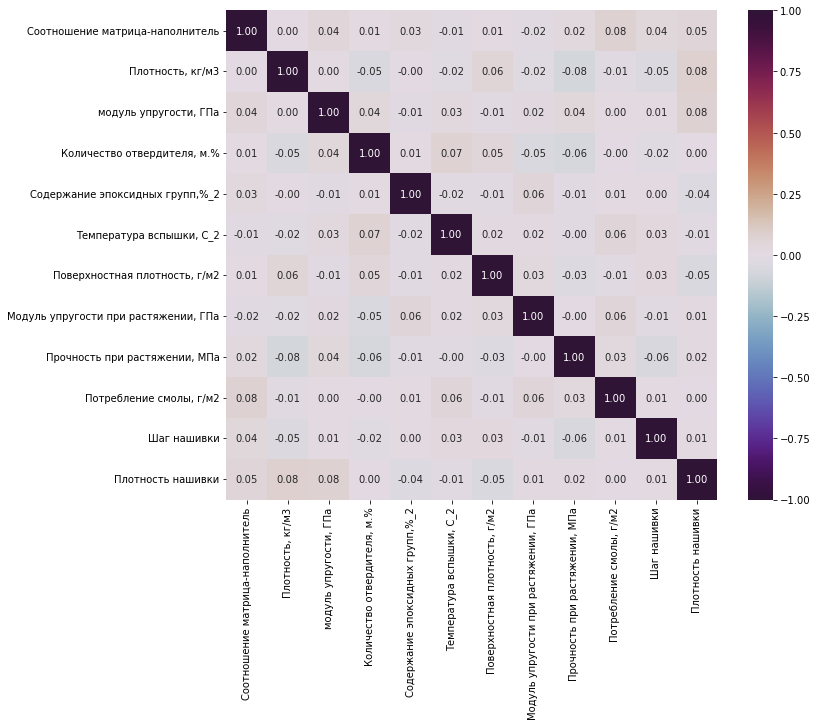

In [143]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_d.corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [144]:
# Проверка по критерию Пирсона
count = 0 
for col in df_d.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_d.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_d[col], df_d[col1]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.076, p-value=0.020



2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.076, p-value=0.020



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.084, p-value=0.010

3
модуль упругости, ГПа









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.078, p-value=0.017

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.072, p-value=0.027







5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2






8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжени

Вывод: статистически значимыми по критерию Пирсона оказываются следующие попарные корреляции между количественными параметрами:

    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.076, p-value=0.020
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.084, p-value=0.010

Учитывая, что изначально присутствует категориальный параметр 'Угол нашивки', следует проверить статистическую значимость попарных корреляций этого параметра с остальными параметрами по критерию Спирмена:

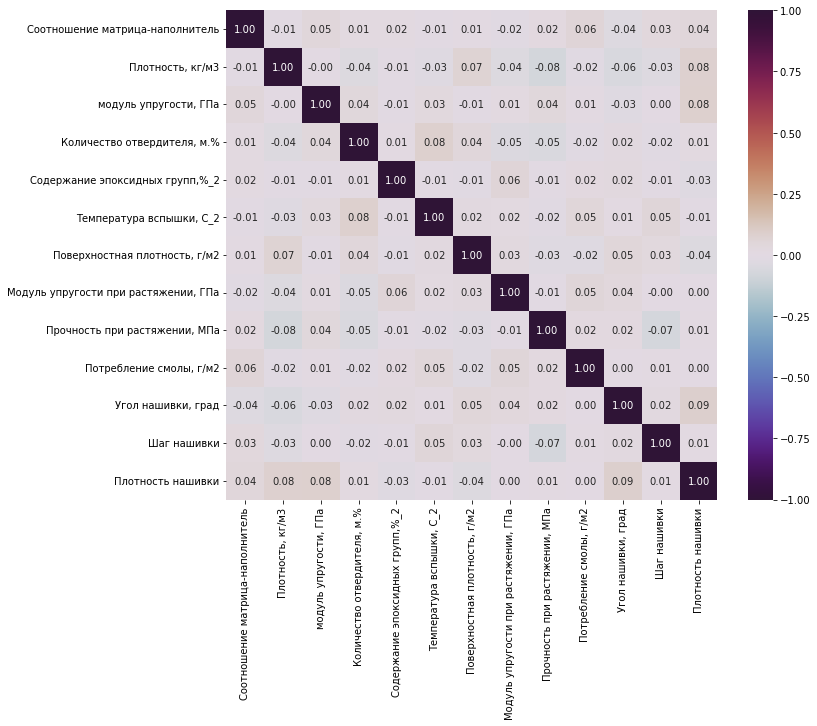

In [145]:
# Мартица корреляции по ранговому критерию корреляции Спирмена для категориальных и количественно-категориальных параметров
fig, ax = plt.subplots(figsize=(11, 9)) # аргумент 'spearman' указывает на критерий Спирмена
hm = sns.heatmap(df.corr(method = 'spearman'),  vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)

Вывод: судя по матрице корреляции, построенной на основании корреляции по Спирмену для количественных и качественных данных, коэффициенты корреляцим малы, кроме параметров 'Относительное удлинение при растяжении', 'Относительное удлинение', 'модуль упругости, ГПа' и 'Модуль упругости при растяжении, ГПа' (они связаны детерминистически), поэтому следует сформулировать и проверить статистическую гипотезу для проверки значимости попарной связи между категориальным параметром 'Угол нашивки, град' и остальными параметрами.


Проверка корреляции по критерию Спирмена:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05


In [146]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_s.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_s['Угол нашивки, град'] , df_s[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.026, p-value=0.403
Плотность, кг/м3 : 	 	 	Statistics=-0.063, p-value=0.044
модуль упругости, ГПа : 	 	 	Statistics=-0.039, p-value=0.215
Количество отвердителя, м.% : 	 	 	Statistics=0.030, p-value=0.334
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.006, p-value=0.855
Температура вспышки, С_2 : 	 	 	Statistics=0.022, p-value=0.484
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.056, p-value=0.075
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.027, p-value=0.380
Прочность при растяжении, МПа : 	 	 	Statistics=0.025, p-value=0.420
Потребление смолы, г/м2 : 	 	 	Statistics=-0.003, p-value=0.925
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.026, p-value=0.408
Плотность нашивки : 	 	 	Statistics=0.101, p-value=0.001

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'модуль упругости, ГПа', 'Количество отверд

Вывод: существует статистически значимая попарная корреляционная связь по критерию Спирмена между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'.


Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Поверхностная плотность', 'Плотность нашивки' и 'Относительное удлинение' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих параметров между собой и с остальными параметрами следует проверять по критерию Спирмена


In [147]:
# Проверка по критерию Спирмена
count = 0 
for col in df_s.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_s.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_s[col], df_s[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.070, p-value=0.026


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=-0.063, p-value=0.044


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.080, p-value=0.010

3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.073, p-value=0.020

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.087, p-value=0.005


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.064, p-value=0.040

Наименование колонок и строк С корреляцией: 
Колич

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Потребление смолы, г/м2' проверка по критерию Спирмена показала, что значимы следующие корреляции:
    
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.087, p-value=0.005
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.064, p-value=0.040
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.068, p-value=0.030
    Содержание эпоксидных групп,%_2  &  Модуль упругости при растяжении, ГПа : Statistics=0.062, p-value=0.048

### 6. Нормализация значений параметров с помощью метода MinMaxScaler

In [151]:
# Загрузка MinMaxScaler из библиотеки sklearn
from sklearn.preprocessing import MinMaxScaler

In [152]:
# Применение MinMaxScaler для нормализации датасета df
min_max_scaler = MinMaxScaler()
df_norm = pd.DataFrame(min_max_scaler.fit_transform(df), columns = df.columns, index=df.index)

In [153]:
# Описательная статистика нормализованного датасета df_norm
df_norm.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,0.498933,0.502695,0.446764,0.504664,0.491216,0.516059,0.373733,0.488647,0.495706,0.521141,0.511752,0.502232,0.513776
std,0.187489,0.187779,0.199583,0.188865,0.180620,0.190624,0.217078,0.191466,0.188915,0.195781,0.500129,0.183258,0.191342
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.372274,0.368517,0.301243,0.376190,0.367716,0.386128,0.205619,0.359024,0.365149,0.392067,0.000000,0.372211,0.390482
50%,0.494538,0.511229,0.447061,0.506040,0.489382,0.515980,0.354161,0.485754,0.491825,0.523766,1.000000,0.504258,0.516029
75%,0.629204,0.624999,0.580446,0.637978,0.623410,0.646450,0.538683,0.615077,0.612874,0.652447,1.000000,0.624604,0.638842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


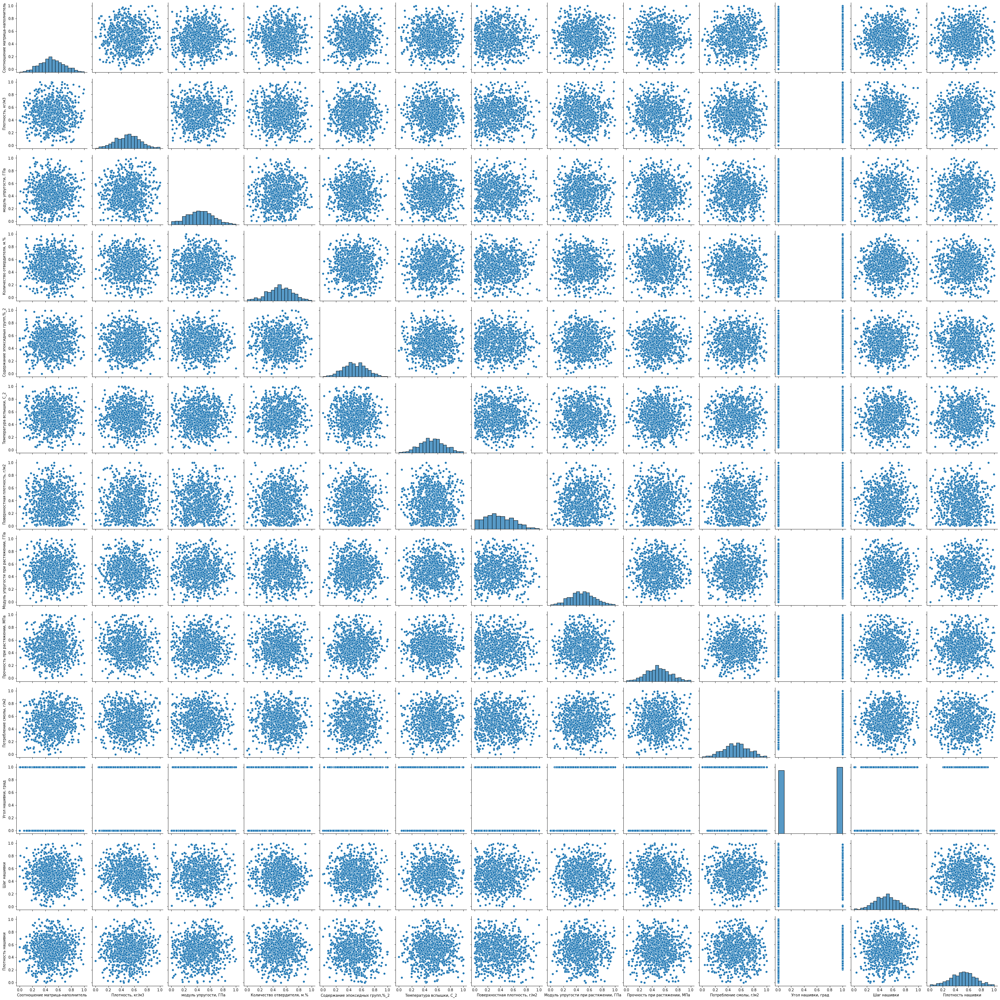

In [154]:
# Попарные графики рассеяния после нормализации
sns.pairplot(df_norm, height=3)

In [155]:
# Вывод информации о датасете df для подготовки к нормализации датасета df
df_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки       

In [156]:
# Параметр 'Угол нашивки, град' - категориальный, поэтому его следует исключить 
# при построении матрицы корреляции по критерию Пирсона
df_dnorm=df_norm[['Соотношение матрица-наполнитель','Плотность, кг/м3','модуль упругости, ГПа','Количество отвердителя, м.%','Содержание эпоксидных групп,%_2','Температура вспышки, С_2','Поверхностная плотность, г/м2','Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа','Потребление смолы, г/м2','Шаг нашивки','Плотность нашивки']]
df_dnorm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
1,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.289334,0.557156
3,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.362355,0.335840
4,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.506083
5,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.557156
6,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.727399


In [157]:
# Изменение типа данных в колонке
df_norm['Угол нашивки, град'] = df_norm['Угол нашивки, град'].astype(int)

In [158]:
# Значения параметра в колонке
df['Угол нашивки, град'].unique()

array([0, 1])

###### Оценка корреляции параметров датасета после очистки и нормализации

Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [159]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.087
Плотность, кг/м3 : 	 	 	Statistics=0.997, p-value=0.095
модуль упругости, ГПа : 	 	 	Statistics=0.995, p-value=0.006
Количество отвердителя, м.% : 	 	 	Statistics=0.996, p-value=0.025
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.998, p-value=0.236
Температура вспышки, С_2 : 	 	 	Statistics=0.997, p-value=0.085
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.978, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.996, p-value=0.023
Прочность при растяжении, МПа : 	 	 	Statistics=0.997, p-value=0.078
Потребление смолы, г/м2 : 	 	 	Statistics=0.996, p-value=0.016
Шаг нашивки : 	 	 	Statistics=0.998, p-value=0.349
Плотность нашивки : 	 	 	Statistics=0.997, p-value=0.052

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Прочность при растяжении, МПа', 'Шаг нашивки

Вывод: после очистки и нормализации по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа' и 'Потребление смолы, г/м2' имеют вид распределения статистически отличный от нормального, распределения всех остальных параметров статистически не отличаются от нормального (уровень значимости 0,05)

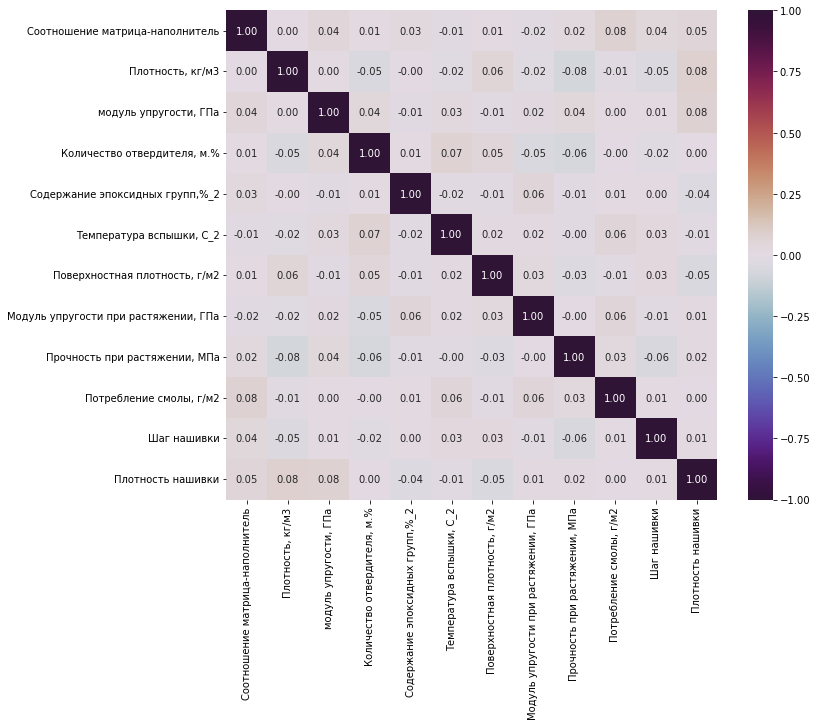

In [160]:
# Матрица корреляции по Пирсону после нормализации
corr = df_dnorm.corr() # Пирсон по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Пирсона:

формулировка гипотезы:

H0: R = 0,

H1: R не равен 0 с заданным уровнем значимости равным 0,05/

In [161]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm.columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col], df_dnorm[col1]) # Критерий Пирсона
        if p > alpha:
            print()
            # print(f'Наименование колонок и строк БЕЗ корреляции: ')
            # print(col, ' & ', col1)
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.076, p-value=0.020



2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.076, p-value=0.020



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.084, p-value=0.010

3
модуль упругости, ГПа









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.078, p-value=0.017

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.072, p-value=0.027







5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2






8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжени

Вывод: статистически значимыми по критерию Пирсона после очистки и нормализации стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021

Статистически значимыми по критерию Пирсона до очистки и нормализации были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.073, p-value=0.020
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.070, p-value=0.025
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.095, p-value=0.002
    Количество отвердителя, м.%  &  Модуль упругости при растяжении, ГПа : Statistics=-0.066, p-value=0.035
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.075, p-value=0.016         

Вывод: количество значимых параметров сократилось, возможно, какие-то значимые данные были удалены при очистке датасета

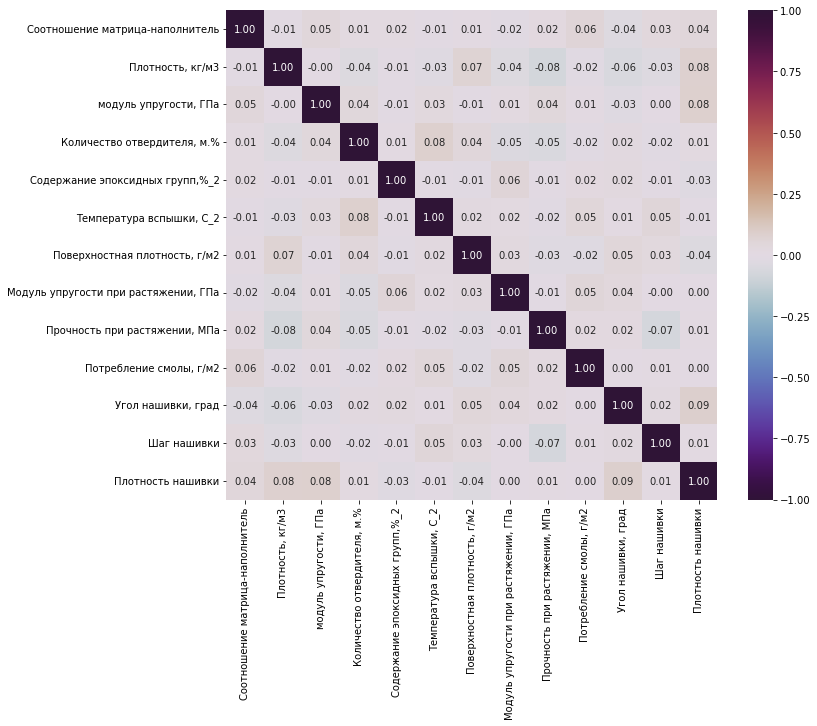

In [162]:
# Матрица корреляции по Спирмену после нормализации
corr = df_norm.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

Проверка корреляции по критерию Спирмена:

формулировка гипотезы: 

H0: R = 0, 

H1: R не равен 0 с заданным уровнем значимости равным 0,05

In [163]:
# Проверка по критерию Спирмена
accepted_list = []
rejected_list = []

for col in df_norm.columns:
    alpha = 0.05
    stat, p = stats.spearmanr(df_norm['Угол нашивки, град'] , df_norm[col]) # ранговая корреляция Спирмена
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=-0.035, p-value=0.282
Плотность, кг/м3 : 	 	 	Statistics=-0.057, p-value=0.079
модуль упругости, ГПа : 	 	 	Statistics=-0.030, p-value=0.364
Количество отвердителя, м.% : 	 	 	Statistics=0.022, p-value=0.494
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.024, p-value=0.470
Температура вспышки, С_2 : 	 	 	Statistics=0.009, p-value=0.790
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.051, p-value=0.120
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.035, p-value=0.283
Прочность при растяжении, МПа : 	 	 	Statistics=0.018, p-value=0.573
Потребление смолы, г/м2 : 	 	 	Statistics=0.001, p-value=0.973
Угол нашивки, град : 	 	 	Statistics=1.000, p-value=0.000
Шаг нашивки : 	 	 	Statistics=0.023, p-value=0.473
Плотность нашивки : 	 	 	Statistics=0.087, p-value=0.008

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа',

Вывод: согласно критерию Спирмена после очистки и нормализация статистически значима корреляция и между 'Угол нашивки, град' и 'Плотность нашивки', корреляция между 'Угол нашивки, град' и 'Плотность, кг/м3' - незначима

Статистически значимыми по критерию Спирмена до очистки и нормализации были следующие попарные корреляции между параметрами: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'

Ранее было показано, что по тесту Шапиро-Уилка параметры 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа' и 'Потребление смолы, г/м2' имеют вид распределения статистически отличный от нормального, поэтому корреляцию этих парметров между собой и с остальными параметрами следует проверять по критерию Спирмена:

In [164]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm.columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm.columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[col], df_norm[col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель













2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.068, p-value=0.037


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.076, p-value=0.020




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Плотность нашивки : 		 
Statistics=0.082, p-value=0.013

3
модуль упругости, ГПа










Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.084, p-value=0.010

4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.084, p-value=0.010








5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2







8
Модуль упругости при растяжении, ГПа






9
Прочность при растяжении

Вывод: кроме того для параметров 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа' и 'Потребление смолы, г/м2' проверка по критерию Спирмена показала, что значимы следующие корреляции:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.068, p-value=0.037
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.084, p-value=0.010
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.084, p-value=0.010
    
Статистически значимыми по критерию Спирмена до очистки и нормализации были следующие попарные корреляции между параметрами:

    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.080, p-value=0.010
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.020,

а также между: 'Угол нашивки, град' и 'Плотность, кг/м3', а также 'Угол нашивки, град' и 'Плотность нашивки'


ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ: судя по матрицам корреляции, построенным на основании корреляции по Пирсону для количественных данных и Спирмена для количественных и категориальных данных, коэффициенты корреляции после очистки от выбросов и нормализации параметров мало изменились, но уменьшилось количество значимых значимость корреляций, возможно в отсеченные части датасета попали какие-то статистически значимые данные

###### Разбиение датасета на части и проверка значимости корреляций в каждой части датасета

In [165]:
# Вывод информации о датасете df_dnorm
df_dnorm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 936 entries, 1 to 1022
Data columns (total 12 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Шаг нашивки                           936 non-null    float64
 11  Плотность нашивки 

In [166]:
# 1-ая часть датасета
df_dnorm[0:214].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
1,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0.289334,0.557156
3,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0.362355,0.335840
4,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.506083
5,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.557156
6,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0.362355,0.727399


In [167]:
# 1-ая часть датасета
df_norm[0:214].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.16223,0.280303,0.71259,0.529221,0,0.289334,0.557156
3,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.16223,0.280303,0.71259,0.529221,0,0.362355,0.335840
4,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0,0.362355,0.506083
5,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0,0.362355,0.557156
6,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.16223,0.280303,0.71259,0.529221,0,0.362355,0.727399


In [168]:
# 2-ая часть датасета
df_dnorm[215:429].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
240,0.554089,0.195715,0.602859,0.753408,0.533849,0.751676,0.149229,0.555788,0.480310,0.598024,0.466240,0.602771
241,0.662559,0.442807,0.537662,0.148129,0.735294,0.119069,0.288520,0.854511,0.734943,0.529850,0.406341,0.802350
242,0.818131,0.506549,0.433228,0.738304,0.207255,0.972834,0.718853,0.119653,0.473854,0.804504,0.299166,0.342783
243,0.476741,0.491515,0.505303,0.513759,0.501438,0.098115,0.490536,0.563810,0.514328,0.509367,0.601903,0.320184
244,0.485585,0.510015,0.190183,0.641306,0.382080,0.039614,0.451177,0.253325,0.244532,0.362931,0.630632,0.662145


In [169]:
# 2-ая часть датасета
df_norm[215:429].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
240,0.554089,0.195715,0.602859,0.753408,0.533849,0.751676,0.149229,0.555788,0.480310,0.598024,0,0.466240,0.602771
241,0.662559,0.442807,0.537662,0.148129,0.735294,0.119069,0.288520,0.854511,0.734943,0.529850,0,0.406341,0.802350
242,0.818131,0.506549,0.433228,0.738304,0.207255,0.972834,0.718853,0.119653,0.473854,0.804504,0,0.299166,0.342783
243,0.476741,0.491515,0.505303,0.513759,0.501438,0.098115,0.490536,0.563810,0.514328,0.509367,0,0.601903,0.320184
244,0.485585,0.510015,0.190183,0.641306,0.382080,0.039614,0.451177,0.253325,0.244532,0.362931,0,0.630632,0.662145


In [170]:
# 3-ья часть датасета
df_dnorm[430:644].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
484,0.440618,0.327373,0.266705,0.421863,0.496863,0.827585,0.245201,0.613157,0.373419,0.268988,0.415136,0.611357
485,0.689348,0.264124,0.352382,0.224352,0.692275,0.781226,0.852869,0.642342,0.380944,0.795565,0.734773,0.240613
486,0.575547,0.672045,0.425127,0.338077,0.380929,0.753056,0.287908,0.408838,0.399834,0.485144,0.472264,0.545310
487,0.497820,0.803973,0.001155,0.266244,0.215422,0.381860,0.052609,0.536380,0.499028,0.589655,0.761495,0.940637
488,0.805788,0.412654,0.473255,0.442818,0.637139,0.522062,0.390031,0.671562,0.401248,0.690266,0.473095,0.178585


In [171]:
# 3-ья часть датасета
df_norm[430:644].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
484,0.440618,0.327373,0.266705,0.421863,0.496863,0.827585,0.245201,0.613157,0.373419,0.268988,0,0.415136,0.611357
485,0.689348,0.264124,0.352382,0.224352,0.692275,0.781226,0.852869,0.642342,0.380944,0.795565,0,0.734773,0.240613
486,0.575547,0.672045,0.425127,0.338077,0.380929,0.753056,0.287908,0.408838,0.399834,0.485144,0,0.472264,0.545310
487,0.497820,0.803973,0.001155,0.266244,0.215422,0.381860,0.052609,0.536380,0.499028,0.589655,0,0.761495,0.940637
488,0.805788,0.412654,0.473255,0.442818,0.637139,0.522062,0.390031,0.671562,0.401248,0.690266,0,0.473095,0.178585


In [172]:
# 4-ая часть датасета
df_dnorm[645:857].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
716,0.589988,0.524589,0.377445,0.643876,0.707322,0.446130,0.411970,0.490686,0.602931,0.696316,0.675031,0.309708
717,0.672189,0.136301,0.809671,0.694627,0.581732,0.495761,0.035280,0.334163,0.550676,0.176864,0.425652,0.492616
720,0.270257,0.744005,0.423296,0.512994,0.647903,0.795612,0.790892,0.627608,0.643624,0.743124,0.667887,0.655719
722,0.371727,0.190182,0.281274,0.565287,0.418473,0.429996,0.109507,0.546444,0.410227,0.406785,0.770903,0.633926
723,0.483599,0.652128,0.409355,0.304963,0.768786,0.374060,0.196253,0.065875,0.442947,0.575327,0.902922,0.635103


In [173]:
# 4-ая часть датасета
df_norm[645:857].head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
716,0.589988,0.524589,0.377445,0.643876,0.707322,0.446130,0.411970,0.490686,0.602931,0.696316,1,0.675031,0.309708
717,0.672189,0.136301,0.809671,0.694627,0.581732,0.495761,0.035280,0.334163,0.550676,0.176864,1,0.425652,0.492616
720,0.270257,0.744005,0.423296,0.512994,0.647903,0.795612,0.790892,0.627608,0.643624,0.743124,1,0.667887,0.655719
722,0.371727,0.190182,0.281274,0.565287,0.418473,0.429996,0.109507,0.546444,0.410227,0.406785,1,0.770903,0.633926
723,0.483599,0.652128,0.409355,0.304963,0.768786,0.374060,0.196253,0.065875,0.442947,0.575327,1,0.902922,0.635103


Оценка нормальности распределения параметров по статистическому критерию Шапиро-Уилка:

In [174]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[0:214].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[0:214][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.990, p-value=0.149
Плотность, кг/м3 : 	 	 	Statistics=0.995, p-value=0.780
модуль упругости, ГПа : 	 	 	Statistics=0.991, p-value=0.208
Количество отвердителя, м.% : 	 	 	Statistics=0.988, p-value=0.063
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.995, p-value=0.744
Температура вспышки, С_2 : 	 	 	Statistics=0.992, p-value=0.295
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.970, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.990, p-value=0.173
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.554
Потребление смолы, г/м2 : 	 	 	Statistics=0.990, p-value=0.136
Шаг нашивки : 	 	 	Statistics=0.992, p-value=0.270
Плотность нашивки : 	 	 	Statistics=0.979, p-value=0.002

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [175]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[215:429].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[215:429][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.997, p-value=0.949
Плотность, кг/м3 : 	 	 	Statistics=0.991, p-value=0.222
модуль упругости, ГПа : 	 	 	Statistics=0.993, p-value=0.356
Количество отвердителя, м.% : 	 	 	Statistics=0.994, p-value=0.571
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.995, p-value=0.639
Температура вспышки, С_2 : 	 	 	Statistics=0.994, p-value=0.483
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.973, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.990, p-value=0.149
Прочность при растяжении, МПа : 	 	 	Statistics=0.990, p-value=0.157
Потребление смолы, г/м2 : 	 	 	Statistics=0.990, p-value=0.142
Шаг нашивки : 	 	 	Statistics=0.990, p-value=0.161
Плотность нашивки : 	 	 	Statistics=0.990, p-value=0.157

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [176]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[430:644].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[430:644][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.989, p-value=0.120
Плотность, кг/м3 : 	 	 	Statistics=0.991, p-value=0.226
модуль упругости, ГПа : 	 	 	Statistics=0.990, p-value=0.173
Количество отвердителя, м.% : 	 	 	Statistics=0.992, p-value=0.343
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.991, p-value=0.232
Температура вспышки, С_2 : 	 	 	Statistics=0.991, p-value=0.231
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.966, p-value=0.000
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.990, p-value=0.147
Прочность при растяжении, МПа : 	 	 	Statistics=0.995, p-value=0.733
Потребление смолы, г/м2 : 	 	 	Statistics=0.991, p-value=0.225
Шаг нашивки : 	 	 	Statistics=0.992, p-value=0.299
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.475

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

In [177]:
# Проверка по критерию Шапиро-Уилка
accepted_list = []
rejected_list = []

for col in df_dnorm[645:857].columns:
    alpha = 0.05
    stat, p = stats.shapiro(df_dnorm[645:857][col]) # Критерий согласия Шапиро-Уилка
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок с данными С нормальным распределением: {accepted_list} \n')
print(f'Наименование колонок с данными БЕЗ нормального распределения : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.992, p-value=0.333
Плотность, кг/м3 : 	 	 	Statistics=0.996, p-value=0.834
модуль упругости, ГПа : 	 	 	Statistics=0.991, p-value=0.225
Количество отвердителя, м.% : 	 	 	Statistics=0.995, p-value=0.777
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.993, p-value=0.395
Температура вспышки, С_2 : 	 	 	Statistics=0.994, p-value=0.517
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.979, p-value=0.003
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.992, p-value=0.348
Прочность при растяжении, МПа : 	 	 	Statistics=0.994, p-value=0.600
Потребление смолы, г/м2 : 	 	 	Statistics=0.990, p-value=0.138
Шаг нашивки : 	 	 	Statistics=0.995, p-value=0.720
Плотность нашивки : 	 	 	Statistics=0.994, p-value=0.497

Наименование колонок с данными С нормальным распределением: ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспы

Вывод: при рассмотрении отдельных частей датасета установлено, что параметры 'Поверхностная плотность, г/м2', 'Плотность нашивки' в 1-ой части датасета, а параметр 'Поверхностная плотность, г/м2' во всех остальных частях имеют вид распределения статистически отличный от нормального

Проверка различия групп по непараметрическому критерию Краскала-Уоллиса для групп больше двух:

Формулируем статистическую гипотезу для выявления различия групп по критерию Краскала-Уоллиса

H0: Статистически значимые отличия в группах отсутствуют с уровнем значимости равным 0,05.

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости

In [178]:
# проверка по критерию Краскала-Уоллиса
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:429][col])
    df3=np.array(df_dnorm[430:644][col])
    df4=np.array(df_dnorm[645:859][col])
    
    stat, p = stats.mstats.kruskalwallis(df1, df2, df3, df4) # критерий Краскала-Уоллиса 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=1.012, p-value=0.798
Плотность, кг/м3 : 	 	 	Statistics=2.113, p-value=0.549
модуль упругости, ГПа : 	 	 	Statistics=1.468, p-value=0.690
Количество отвердителя, м.% : 	 	 	Statistics=0.817, p-value=0.845
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=1.775, p-value=0.620
Температура вспышки, С_2 : 	 	 	Statistics=4.157, p-value=0.245
Поверхностная плотность, г/м2 : 	 	 	Statistics=1.905, p-value=0.592
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.991, p-value=0.803
Прочность при растяжении, МПа : 	 	 	Statistics=1.117, p-value=0.773
Потребление смолы, г/м2 : 	 	 	Statistics=2.273, p-value=0.518
Шаг нашивки : 	 	 	Statistics=0.995, p-value=0.802
Плотность нашивки : 	 	 	Statistics=3.443, p-value=0.328

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,

Непараметрический критерий Фридмана для дисперсионного анализа групп:


Нулевая гипотеза (H 0 ): Среднее значение для каждой совокупности равно.

Альтернативная гипотеза: (H 1): по крайней мере одно среднее значение генеральной совокупности отличается от остальных

In [179]:
# проверка по критерию Фридмана
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:213].reset_index(drop=True)[col])
    df2=np.array(df_dnorm[214:427].reset_index(drop=True)[col])
    df3=np.array(df_dnorm[428:641].reset_index(drop=True)[col])
    df4=np.array(df_dnorm[642:855].reset_index(drop=True)[col])
    
    stat, p = stats.friedmanchisquare(df1, df2, df3, df4) # критерий Фридмана 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.285, p-value=0.963
Плотность, кг/м3 : 	 	 	Statistics=2.493, p-value=0.477
модуль упругости, ГПа : 	 	 	Statistics=2.144, p-value=0.543
Количество отвердителя, м.% : 	 	 	Statistics=1.225, p-value=0.747
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=1.468, p-value=0.690
Температура вспышки, С_2 : 	 	 	Statistics=5.862, p-value=0.119
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.730, p-value=0.866
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=2.510, p-value=0.474
Прочность при растяжении, МПа : 	 	 	Statistics=0.431, p-value=0.934
Потребление смолы, г/м2 : 	 	 	Statistics=1.715, p-value=0.633
Шаг нашивки : 	 	 	Statistics=0.915, p-value=0.822
Плотность нашивки : 	 	 	Statistics=3.659, p-value=0.301

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,

Вывод: сравнение датасетов по столбцам показывает, что отличие групп статистически незначимо, расчет по критерию Фридмана для всего датасета показывает, что различие по дисперсиям все-таки возможно значимо:

Статистическое сравнение 2х групп следует осуществить по критерию Колмогорова-Смирнова.

Формулировка гипотезы по критерию Колмогорова-Смирнова:

H0: Статистически значимые отличия в группах отсутствуют (уровень значимости равен 0,05).

H1: Присутствуют статистически значимые отличия в группах с тем же уровнем значимости.

In [180]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.053, p-value=0.723
Плотность, кг/м3 : 	 	 	Statistics=0.047, p-value=0.832
модуль упругости, ГПа : 	 	 	Statistics=0.098, p-value=0.079
Количество отвердителя, м.% : 	 	 	Statistics=0.065, p-value=0.471
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.078, p-value=0.252
Температура вспышки, С_2 : 	 	 	Statistics=0.123, p-value=0.012
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.054, p-value=0.705
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.076, p-value=0.276
Прочность при растяжении, МПа : 	 	 	Statistics=0.067, p-value=0.424
Потребление смолы, г/м2 : 	 	 	Statistics=0.053, p-value=0.718
Шаг нашивки : 	 	 	Statistics=0.079, p-value=0.236
Плотность нашивки : 	 	 	Statistics=0.161, p-value=0.000

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,

In [181]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[215:429][col])
    df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.046, p-value=0.860
Плотность, кг/м3 : 	 	 	Statistics=0.097, p-value=0.084
модуль упругости, ГПа : 	 	 	Statistics=0.065, p-value=0.463
Количество отвердителя, м.% : 	 	 	Statistics=0.052, p-value=0.743
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.052, p-value=0.735
Температура вспышки, С_2 : 	 	 	Statistics=0.117, p-value=0.020


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inst

Поверхностная плотность, г/м2 : 	 	 	Statistics=0.047, p-value=0.840
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.055, p-value=0.672
Прочность при растяжении, МПа : 	 	 	Statistics=0.050, p-value=0.781
Потребление смолы, г/м2 : 	 	 	Statistics=0.039, p-value=0.950
Шаг нашивки : 	 	 	Statistics=0.084, p-value=0.187
Плотность нашивки : 	 	 	Statistics=0.093, p-value=0.104

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Плотность нашивки'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : ['Температура вспышки, С_2']


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\876277432.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:214].append(df_dnorm[430:],sort=False)[col])


In [182]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[430:644][col])
    df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.075, p-value=0.299
Плотность, кг/м3 : 	 	 	Statistics=0.059, p-value=0.597
модуль упругости, ГПа : 	 	 	Statistics=0.059, p-value=0.583
Количество отвердителя, м.% : 	 	 	Statistics=0.077, p-value=0.270
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.061, p-value=0.544


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Температура вспышки, С_2 : 	 	 	Statistics=0.067, p-value=0.434
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.076, p-value=0.283


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])


Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.081, p-value=0.221
Прочность при растяжении, МПа : 	 	 	Statistics=0.064, p-value=0.475
Потребление смолы, г/м2 : 	 	 	Statistics=0.083, p-value=0.197
Шаг нашивки : 	 	 	Statistics=0.053, p-value=0.714
Плотность нашивки : 	 	 	Statistics=0.077, p-value=0.260

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2', 'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа', 'Потребление смолы, г/м2', 'Шаг нашивки', 'Плотность нашивки'] 

Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : []


C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])
C:\Users\Admin\AppData\Local\Temp\ipykernel_8492\3527739469.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2=np.array(df_dnorm[0:429].append(df_dnorm[645:],sort=False)[col])


In [183]:
# проверка по критерию Коломогорова-Смирнова
accepted_list = []
rejected_list = []

for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:644][col])
    df2=np.array(df_dnorm[645:][col])
    stat, p = stats.kstest(df1, df2) # критерий Колмогорова-Смирнова 
    print(col, ': \t \t \t'  'Statistics=%.3f, p-value=%.3f' % (stat, p))
    if p > alpha:
        accepted_list.append(col)
    else:
        rejected_list.append(col)
print()
print(f'Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : {accepted_list} \n')
print(f'Наименование колонок, для которых принимается альтернативная H1 и отвергается H0 : {rejected_list}')

Соотношение матрица-наполнитель : 	 	 	Statistics=0.046, p-value=0.777
Плотность, кг/м3 : 	 	 	Statistics=0.094, p-value=0.053
модуль упругости, ГПа : 	 	 	Statistics=0.068, p-value=0.299
Количество отвердителя, м.% : 	 	 	Statistics=0.042, p-value=0.843
Содержание эпоксидных групп,%_2 : 	 	 	Statistics=0.053, p-value=0.605
Температура вспышки, С_2 : 	 	 	Statistics=0.057, p-value=0.521
Поверхностная плотность, г/м2 : 	 	 	Statistics=0.060, p-value=0.438
Модуль упругости при растяжении, ГПа : 	 	 	Statistics=0.047, p-value=0.754
Прочность при растяжении, МПа : 	 	 	Statistics=0.080, p-value=0.144
Потребление смолы, г/м2 : 	 	 	Statistics=0.083, p-value=0.121
Шаг нашивки : 	 	 	Statistics=0.051, p-value=0.647
Плотность нашивки : 	 	 	Statistics=0.158, p-value=0.000

Наименование колонок, для которых принимается H0 и отвергается альтернативная H1 : ['Соотношение матрица-наполнитель', 'Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,

Вывод: попарное различие групп по непараметрическому критерию Колмогорова-Смирнова наблюдается по параметру 'Плотность нашивки'

Однофакторный дисперсионный анализ использует следующие нулевую и альтернативную гипотезы :

    H 0 (нулевая гипотеза): µ 1 = µ 2 = µ 3 = … = µ k (все средние значения совокупности равны)
    H 1 (нулевая гипотеза): по крайней мере одно среднее значение популяции отличаетсяот остальных


Чтобы результаты однофакторного дисперсионного анализа были достоверными, должны выполняться следующие допущения:
1. Нормальность. Каждая выборка была взята из нормально распределенной популяции.
2. Равные дисперсии — дисперсии совокупностей, из которых взяты выборки, равны. Вы можете использовать тест Бартлетта, чтобы проверить это предположение.
3. Независимость.Наблюдения в каждой группе независимы друг от друга, а наблюдения внутри групп были получены путем случайной выборки.    


Тест Бартлетта использует следующие нулевые и альтернативные гипотезы :

H 0 : Дисперсия среди каждой группы равна.

H 1 : По крайней мере, одна группа имеет дисперсию, не равную остальным.

In [184]:
# Проверка по критериям ANOVA & Baltlet-test
for col in df_dnorm.columns:
    alpha = 0.05
    df1=np.array(df_dnorm[0:214][col])
    df2=np.array(df_dnorm[215:429][col])
    df3=np.array(df_dnorm[430:644][col])
    df4=np.array(df_dnorm[645:859][col])
    stat1, bart_test = stats.bartlett(df1, df2, df3, df4)
    stat2, fish_test = f_oneway(df1, df2, df3, df4)
    print(col, ': \t \t \t'  'Statistics Bartlet=%.3f, p-value=%.3f' % (stat1, bart_test))
    print(col, ': \t \t \t'  'Statistics F-test=%.3f, p-value=%.3f' % (stat2, fish_test))

Соотношение матрица-наполнитель : 	 	 	Statistics Bartlet=7.261, p-value=0.064
Соотношение матрица-наполнитель : 	 	 	Statistics F-test=0.494, p-value=0.687
Плотность, кг/м3 : 	 	 	Statistics Bartlet=6.338, p-value=0.096
Плотность, кг/м3 : 	 	 	Statistics F-test=0.492, p-value=0.688
модуль упругости, ГПа : 	 	 	Statistics Bartlet=4.533, p-value=0.209
модуль упругости, ГПа : 	 	 	Statistics F-test=0.707, p-value=0.548
Количество отвердителя, м.% : 	 	 	Statistics Bartlet=4.358, p-value=0.225
Количество отвердителя, м.% : 	 	 	Statistics F-test=0.237, p-value=0.871
Содержание эпоксидных групп,%_2 : 	 	 	Statistics Bartlet=1.649, p-value=0.648
Содержание эпоксидных групп,%_2 : 	 	 	Statistics F-test=0.613, p-value=0.607
Температура вспышки, С_2 : 	 	 	Statistics Bartlet=3.797, p-value=0.284
Температура вспышки, С_2 : 	 	 	Statistics F-test=1.319, p-value=0.267
Поверхностная плотность, г/м2 : 	 	 	Statistics Bartlet=1.980, p-value=0.576
Поверхностная плотность, г/м2 : 	 	 	Statistics F-tes

Вывод: дисперсии статистически не различаются

Корреляционные матрицы для частей датасета:

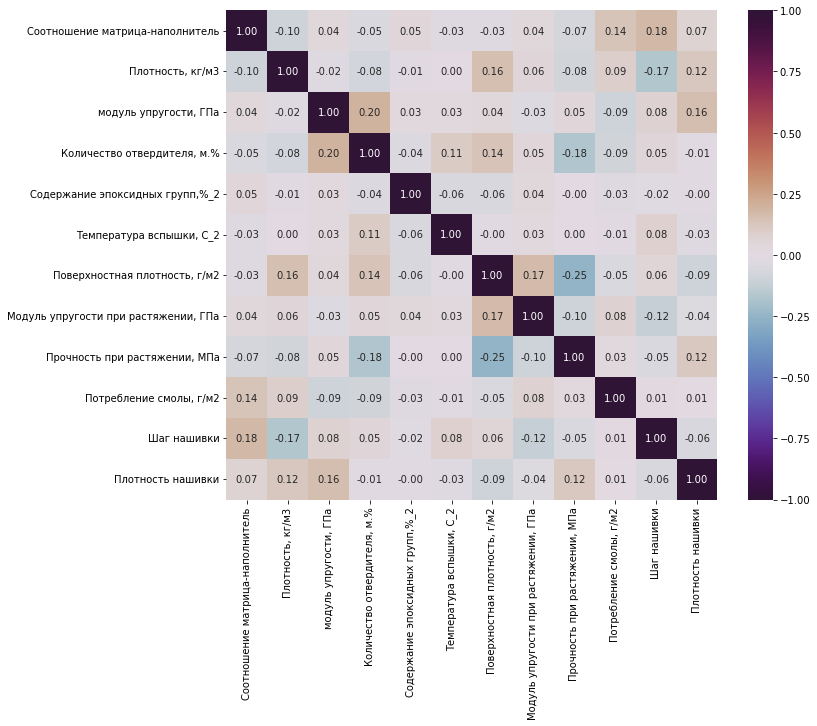

In [185]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[0:214].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [186]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[0:214].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[0:214].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][0:214], df_dnorm[col1][0:214]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель









Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : 		 
Statistics=0.137, p-value=0.046

Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.180, p-value=0.008


2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.155, p-value=0.023




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.169, p-value=0.013


3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.199, p-value=0.004








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.159, p-value=0.020

4
Количество отвердителя, м.%



Наименование колонок и строк С корреляцией: 
Количество отвердителя

Выводы: статистически значимыми по критерию Пирсона после очистки для 1-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:
    
    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.137, p-value=0.046
    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.180, p-value=0.008
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.155, p-value=0.023
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.169, p-value=0.013
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.199, p-value=0.004
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.159, p-value=0.020
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.140, p-value=0.040
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.176, p-value=0.010
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.169, p-value=0.013
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.252, p-value=0.000

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021

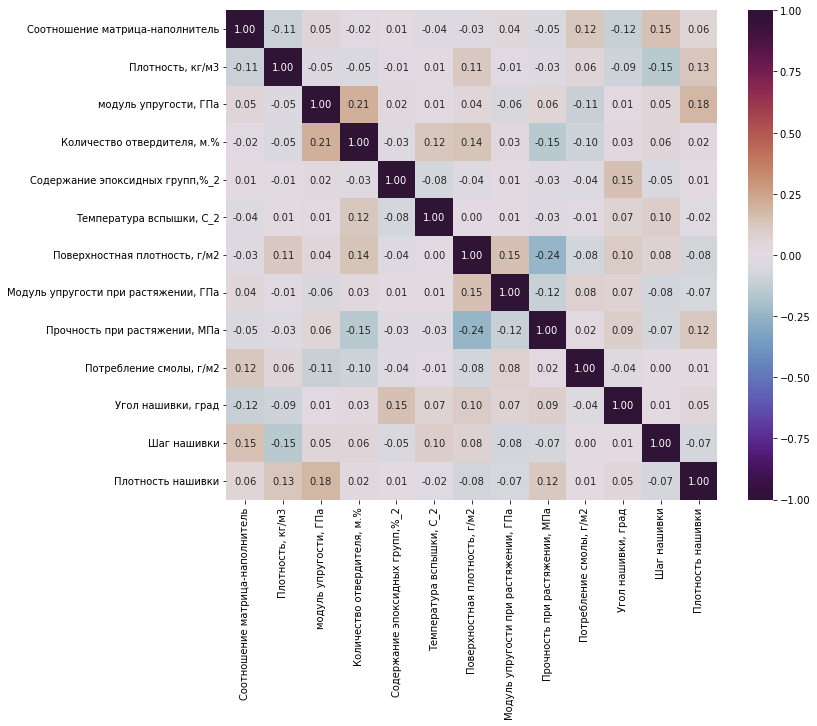

In [187]:
# Матрица корреляции по Спирмену
df1 = df_norm[0:214]
corr = df1.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [188]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[0:214].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[0:214].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[0:214][col], df_norm[0:214][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель











Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Шаг нашивки : 		 
Statistics=0.148, p-value=0.030


2
Плотность, кг/м3










Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Шаг нашивки : 		 
Statistics=-0.151, p-value=0.027


3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=0.206, p-value=0.002









Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Плотность нашивки : 		 
Statistics=0.183, p-value=0.007

4
Количество отвердителя, м.%



Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.136, p-value=0.047


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Прочность при растяжении, МПа : 		 
Statistics=-0.150, p-value=0.028





5
Содержание эпоксидных групп,%_2






Наи

Вывод: в 1-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Шаг нашивки : Statistics=0.148, p-value=0.030
    Плотность, кг/м3  &  Шаг нашивки : Statistics=-0.151, p-value=0.027
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=0.206, p-value=0.002
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.183, p-value=0.007
    Количество отвердителя, м.%  &  Поверхностная плотность, г/м2 : Statistics=0.136, p-value=0.047
    Количество отвердителя, м.%  &  Прочность при растяжении, МПа : Statistics=-0.150, p-value=0.028
    Содержание эпоксидных групп,%_2  &  Угол нашивки, град : Statistics=0.153, p-value=0.025
    Поверхностная плотность, г/м2  &  Модуль упругости при растяжении, ГПа : Statistics=0.150, p-value=0.028
    Поверхностная плотность, г/м2  &  Прочность при растяжении, МПа : Statistics=-0.244, p-value=0.000

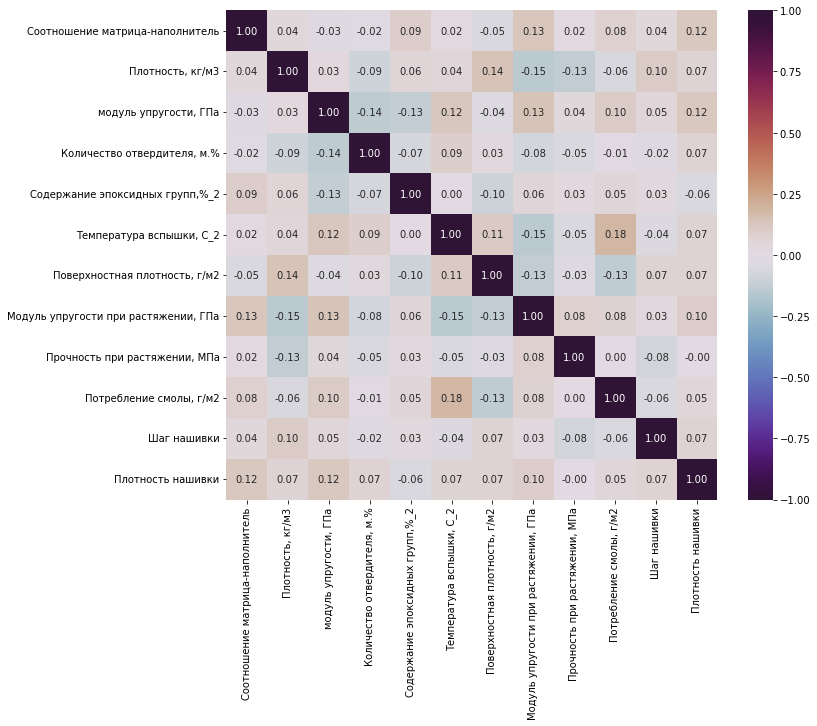

In [189]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[215:429].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [190]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[215:429].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[215:429].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][215:429], df_dnorm[col1][215:429]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель












2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.141, p-value=0.040

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.146, p-value=0.033





3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.138, p-value=0.043









4
Количество отвердителя, м.%









5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.148, p-value=0.031


Наименование колонок и строк С корреляцией: 
Температура вспышки, С_2  &  Потребление смолы, г/м2 : 		 
Statistics=0.181, p-value=0.008



7
Поверхностная плотность, г/м2






8
Модуль упругости при растяжении, Г

Выводы: статистически значимыми по критерию Пирсона после очистки для 2-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.141, p-value=0.040
    Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : Statistics=-0.146, p-value=0.033
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=-0.138, p-value=0.043
    Температура вспышки, С_2  &  Модуль упругости при растяжении, ГПа : Statistics=-0.148, p-value=0.031
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.181, p-value=0.008

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021

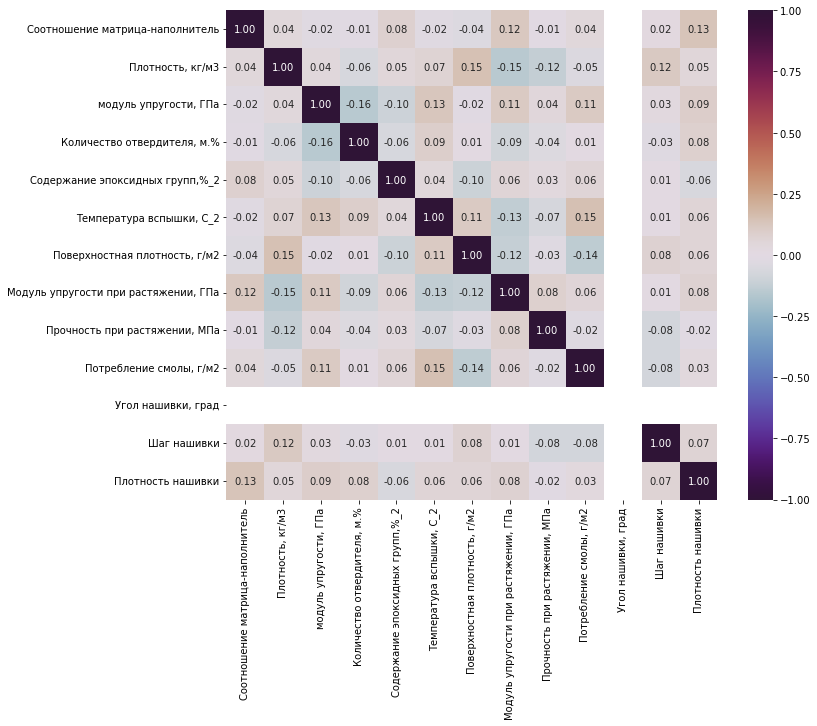

In [191]:
# Матрица корреляции по Спирмену
df2 = df_norm[215:429]
corr = df2.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [192]:
# Значения параметра в колонке
df2['Угол нашивки, град'].unique()

array([0])

In [193]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[215:429].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[215:429].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[215:429][col], df_norm[215:429][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель










Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Плотность нашивки : 		 
Statistics=0.135, p-value=0.049

2
Плотность, кг/м3





Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.146, p-value=0.033

Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : 		 
Statistics=-0.149, p-value=0.029



Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan



3
модуль упругости, ГПа

Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Количество отвердителя, м.% : 		 
Statistics=-0.157, p-value=0.022







Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, 

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:4484: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


Вывод: в 2-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Плотность нашивки : Statistics=0.135, p-value=0.049
    Плотность, кг/м3  &  Поверхностная плотность, г/м2 : Statistics=0.146, p-value=0.033
    Плотность, кг/м3  &  Модуль упругости при растяжении, ГПа : Statistics=-0.149, p-value=0.029
    модуль упругости, ГПа  &  Количество отвердителя, м.% : Statistics=-0.157, p-value=0.022
    Температура вспышки, С_2  &  Потребление смолы, г/м2 : Statistics=0.151, p-value=0.027
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=-0.139, p-value=0.042

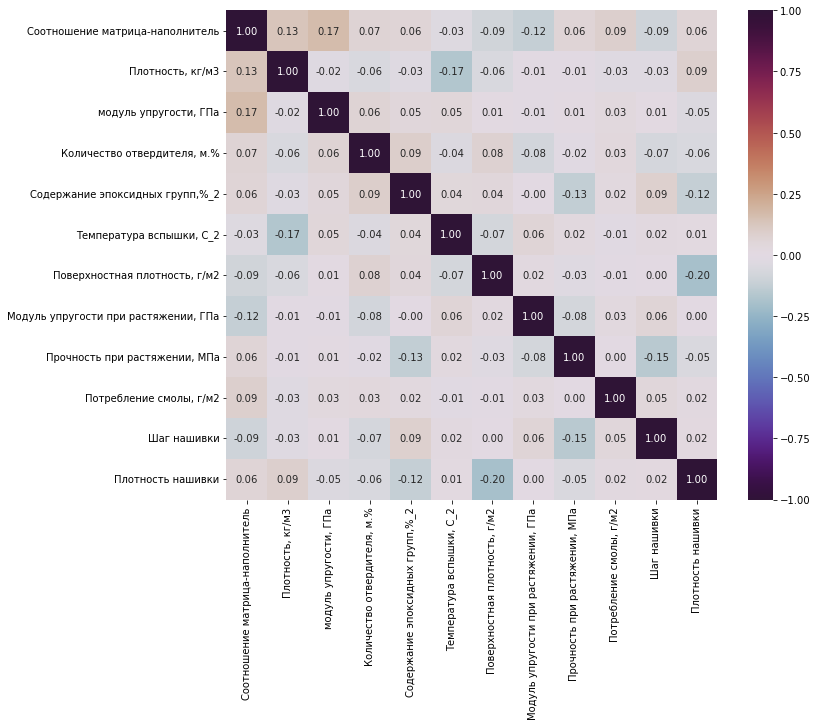

In [194]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[430:644].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [195]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[430:644].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[430:644].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][430:644], df_dnorm[col1][430:644]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))


1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.165, p-value=0.015










2
Плотность, кг/м3




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Температура вспышки, С_2 : 		 
Statistics=-0.172, p-value=0.012







3
модуль упругости, ГПа










4
Количество отвердителя, м.%









5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2





Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Плотность нашивки : 		 
Statistics=-0.199, p-value=0.004

8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжении, МПа


Наименование колонок и строк С корреляцией: 
Прочность при растяжении, МПа  &  Шаг нашивки : 		 
Statistics=-0.150, p-value=0.029


10
Потребление смолы, г/м2



11
Шаг нашивки


12
Плотность нашивки


Выводы: статистически значимыми по критерию Пирсона после очистки для 3-ьей четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.165, p-value=0.015
    Плотность, кг/м3  &  Температура вспышки, С_2 : Statistics=-0.172, p-value=0.012
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.199, p-value=0.004
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.150, p-value=0.029

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021            

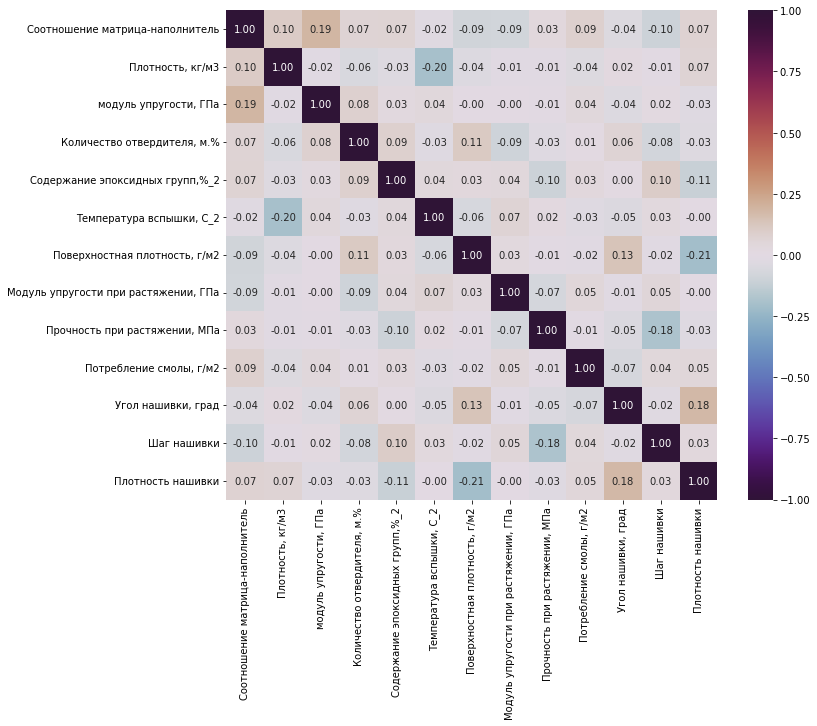

In [196]:
# Матрица корреляции по Спирмену
df3 = df_norm[430:644]
corr = df3.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [197]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[430:644].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[430:644].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[430:644][col], df_norm[430:644][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель


Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  модуль упругости, ГПа : 		 
Statistics=0.187, p-value=0.006











2
Плотность, кг/м3




Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Температура вспышки, С_2 : 		 
Statistics=-0.199, p-value=0.003








3
модуль упругости, ГПа











4
Количество отвердителя, м.%










5
Содержание эпоксидных групп,%_2









6
Температура вспышки, С_2








7
Поверхностная плотность, г/м2




Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Угол нашивки, град : 		 
Statistics=0.134, p-value=0.050


Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Плотность нашивки : 		 
Statistics=-0.209, p-value=0.002

8
Модуль упругости при растяжении, ГПа






9
Прочность при растяжении, МПа



Наименование колонок и строк С корреляцией: 
Прочность при растяжении, МПа  &  Шаг нашивки : 		 
Statistic

Вывод: в 3-ьей части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  модуль упругости, ГПа : Statistics=0.187, p-value=0.006
    Плотность, кг/м3  &  Температура вспышки, С_2 : Statistics=-0.199, p-value=0.003
    Поверхностная плотность, г/м2  &  Угол нашивки, град : Statistics=0.134, p-value=0.050
    Поверхностная плотность, г/м2  &  Плотность нашивки : Statistics=-0.209, p-value=0.002
    Прочность при растяжении, МПа  &  Шаг нашивки : Statistics=-0.182, p-value=0.008
    Угол нашивки, град  &  Плотность нашивки : Statistics=0.177, p-value=0.009

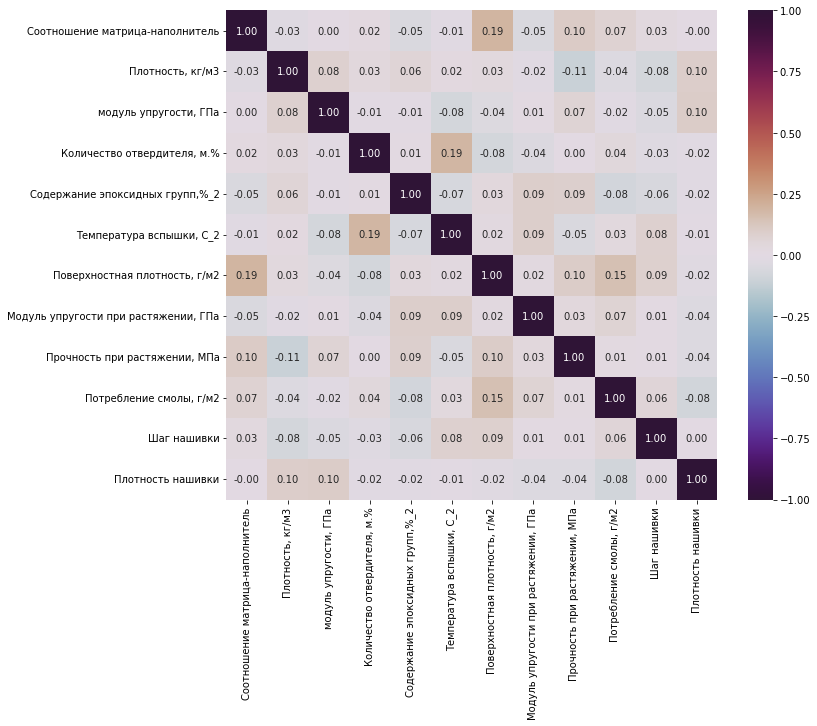

In [198]:
# Матрица корреляции по Пирсону для количественных параметров
corr = df_dnorm[645:857].corr() # Пирсон установлен по умолчанию
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [199]:
# Проверка по критерию Пирсона
count = 0 
for col in df_dnorm[645:857].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_dnorm[645:857].columns[count:]:
        alpha = 0.05
        stat, p = stats.pearsonr(df_dnorm[col][645:857], df_dnorm[col1][645:857]) # Критерий Пирсона
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.192, p-value=0.005






2
Плотность, кг/м3











3
модуль упругости, ГПа










4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.187, p-value=0.006







5
Содержание эпоксидных групп,%_2








6
Температура вспышки, С_2







7
Поверхностная плотность, г/м2



Наименование колонок и строк С корреляцией: 
Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : 		 
Statistics=0.151, p-value=0.027



8
Модуль упругости при растяжении, ГПа





9
Прочность при растяжении, МПа




10
Потребление смолы, г/м2



11
Шаг нашивки


12
Плотность нашивки


Выводы: статистически значимыми по критерию Пирсона после очистки для 4-ой четверти датасета стали следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : Statistics=0.192, p-value=0.005
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.187, p-value=0.006
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.151, p-value=0.027    

Статистически значимыми по критерию Пирсона до очистки были следующие попарные корреляции между количественными параметрами:

    Соотношение матрица-наполнитель  &  Потребление смолы, г/м2 : Statistics=0.075, p-value=0.028
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.069, p-value=0.042
    Плотность, кг/м3  &  Плотность нашивки : Statistics=0.089, p-value=0.009
    модуль упругости, ГПа  &  Плотность нашивки : Statistics=0.073, p-value=0.033
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.079, p-value=0.021         

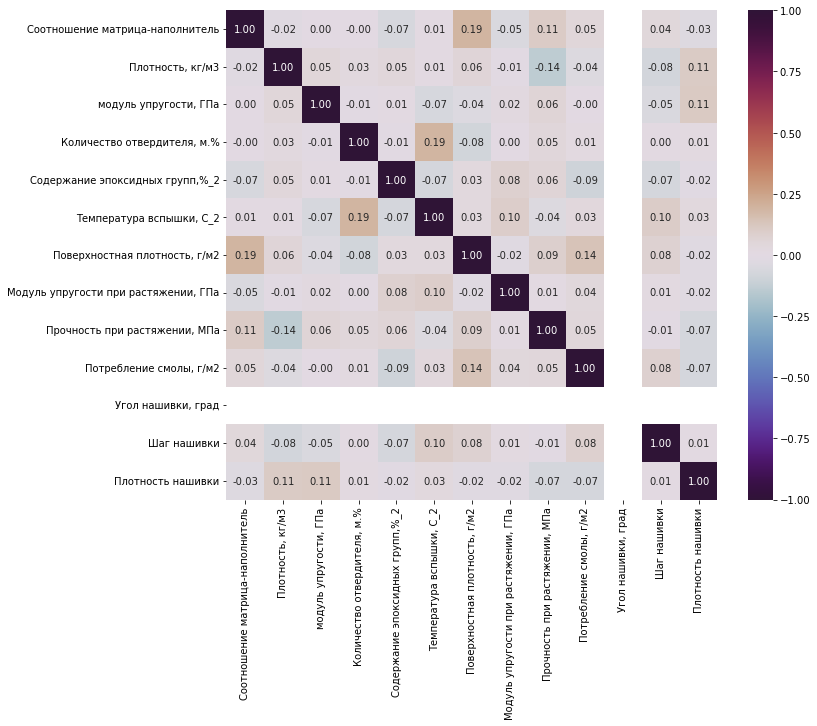

In [200]:
# Матрица корреляции по Спирмену
df4 = df_norm[645:857]
corr = df4.corr(method = 'spearman') # Спирмен
fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [201]:
# Значения параметра в колонке
df4['Угол нашивки, град'].unique()

array([1])

In [202]:
# Проверка по критерию Спирмена
count = 0 
for col in df_norm[645:857].columns:
    print()
    count += 1
    print(count)
    print(col)
    for col1 in df_norm[645:857].columns[count:]:
        alpha = 0.05
        stat, p = stats.spearmanr(df_norm[645:857][col], df_norm[645:857][col1]) # Критерий Спирмена
        if p > alpha:
            print()
        else:
            print()
            print(f'Наименование колонок и строк С корреляцией: ')
            print(col, ' & ', col1, ': \t\t \n'  'Statistics=%.3f, p-value=%.3f' % (stat, p))



1
Соотношение матрица-наполнитель






Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : 		 
Statistics=0.189, p-value=0.006




Наименование колонок и строк С корреляцией: 
Соотношение матрица-наполнитель  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan



2
Плотность, кг/м3







Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Прочность при растяжении, МПа : 		 
Statistics=-0.140, p-value=0.042


Наименование колонок и строк С корреляцией: 
Плотность, кг/м3  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan



3
модуль упругости, ГПа








Наименование колонок и строк С корреляцией: 
модуль упругости, ГПа  &  Угол нашивки, град : 		 
Statistics=nan, p-value=nan



4
Количество отвердителя, м.%


Наименование колонок и строк С корреляцией: 
Количество отвердителя, м.%  &  Температура вспышки, С_2 : 		 
Statistics=0.190, p-value=0.005





Наименование колонок и строк С корреляцией: 
Кол

Вывод: в 4-ой части датасета по критерию Спирмена значимыми являются корреляции между следующими параметрами:

    Соотношение матрица-наполнитель  &  Поверхностная плотность, г/м2 : Statistics=0.189, p-value=0.006
    Плотность, кг/м3  &  Прочность при растяжении, МПа : Statistics=-0.140, p-value=0.042
    Количество отвердителя, м.%  &  Температура вспышки, С_2 : Statistics=0.190, p-value=0.005
    Поверхностная плотность, г/м2  &  Потребление смолы, г/м2 : Statistics=0.137, p-value=0.046

ОБЩИЙ ВЫВОД ПО КОРРЕЛЯЦИИ ДАТАСЕТА, РАЗБИТОГО НА 4 РАВНЫЕ ЧАСТИ: для 1-ой части датасета произошло заметное изменение значимости параметров, а также увеличение некоторых коэффициентов корреляции в корреляционной матрице, отсюда можно сделать вывод, что, вероятно, в 1-ой четверти датасета находится статистически значимая часть датасета

ОБЩИЙ ВЫВОД ПО ПРЕДВАРИТЕЛЬНОЙ ОБРАБОТКЕ ДАТАСЕТА: Данные датасета представляют собой в значительной мере случайные числа с нормальным распределением, кроме значений углов нашивки в 'Угол нашивки, град'. Статистически отличаются от нормального распределения параметры 'модуль упругости, ГПа', 'Поверхностная плотность' и 'Плотность нашивки'.

Не удалось выяснить в общем датасете также заметные связи между данными из двух разных файлов 'X_bp.xlsx' и 'X_nup.xlsx'. Соответствие между данными из этих двух файлов вероятно является произвольным.

Показатель R-квадрат рассмотренных линейных моделей регрессии без учета расчетных параметров 'Относительное удлинение при растяжении' и 'Относительное удлинение' максимально имеет величину не более 0,03, что указывает на низкое качество моделей, которые выдают результат близкий к средним значениям.

Был сделан ОБЩИЙ ВЫВОД, что данные включают в себя значительное количество сгенерированных чисел с нормальным распределением